# 3D Graphics Systems | AI Graphics - Theory and Practice | IMPA 2023
### Instructor: Luiz Velho
### TA: Hallison Paz
### Course info: https://lvelho.impa.br/i3d23/

# Lab Class #1 - Neural Networks for Function Approximation

Google Colab is an online environment that allows us to write and execute code, and share our solutions with collaborators. We are going to use this environment as our main resource to distribute the assignments of this course as it is particularly useful for experimental and educational code.

The following video (Portuguese only) provides an overview of the Google Colab environment and may help you undestand how to work with many features available in this tool.

In [ ]:
from IPython.display import HTML
HTML('''<iframe width="560" height="315" 
        src="https://www.youtube.com/embed/_mIwsA2ddSc" 
        frameborder="0" allow="accelerometer; autoplay; encrypted-media; 
        gyroscope; picture-in-picture" allowfullscreen></iframe>''')

### 0. Google Colab Setup

First we need to run a few commands to set up our environment on Google Colab. If you are running this notebook on a local machine you can skip this section.

1. Run the following cell to mount your Google Drive. Follow the link, sign in to your Google account (the same account you used to store this notebook!) and copy the authorization code into the text box that appears below.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


2. You can use command line instructions like `ls` and `cd` to find the folder that this notebook is stored. Move to this folder by changing the code below to access your folder:

In [ ]:
%ls "/content/drive/MyDrive/s3d21"

ls: cannot access '/content/drive/MyDrive/s3d21': No such file or directory


3. If you're using python scripts together with your implementation we recommend using the [autoreload](https://ipython.readthedocs.io/en/stable/config/extensions/autoreload.html?highlight=autoreload) extension. This allows us to edit .py source files, and re-import them into the notebook for a seamless editing and debugging experience.

In [ ]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# 1. What is an Artificial Neural Network?

## 1.1 Perceptron: the artificial neuron

* Perceptron, [implementação de Thomas Countz](https://www.thomascountz.com/2018/04/05/19-line-line-by-line-python-perceptron)

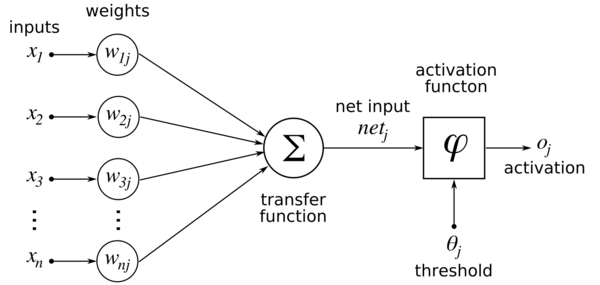

### Warm Up [Optional]

O1. Can you implement a Perceptron without using a deep learning specific framework?



Epoch: 0; Train Loss: 0.5351819396018982
Epoch: 25; Train Loss: 0.48900124430656433
Epoch: 50; Train Loss: 0.37577423453330994
Epoch: 75; Train Loss: 0.1456693410873413
Epoch: 100; Train Loss: 0.034802474081516266
Epoch: 125; Train Loss: 0.03138972818851471
Epoch: 150; Train Loss: 0.030528439208865166
Epoch: 175; Train Loss: 0.02973438799381256
Epoch: 200; Train Loss: 0.029459571465849876
Epoch: 225; Train Loss: 0.029224207624793053
Epoch: 250; Train Loss: 0.028979824855923653
Epoch: 275; Train Loss: 0.028558162972331047
Epoch: 300; Train Loss: 0.028308428823947906
Epoch: 325; Train Loss: 0.028075216338038445
Epoch: 350; Train Loss: 0.02784334495663643
Epoch: 375; Train Loss: 0.02761208266019821
Epoch: 400; Train Loss: 0.02738272212445736
Epoch: 425; Train Loss: 0.027154715731739998
Epoch: 450; Train Loss: 0.026926133781671524
Epoch: 475; Train Loss: 0.026698218658566475
Epoch: 500; Train Loss: 0.026473578065633774
Epoch: 525; Train Loss: 0.026252254843711853
Epoch: 550; Train Loss: 0.

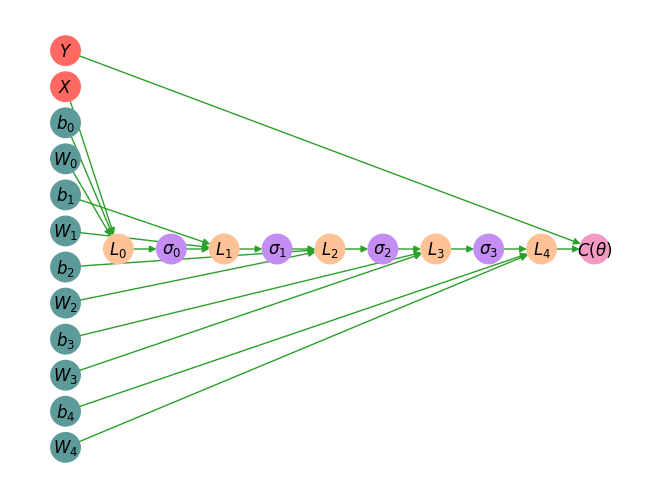

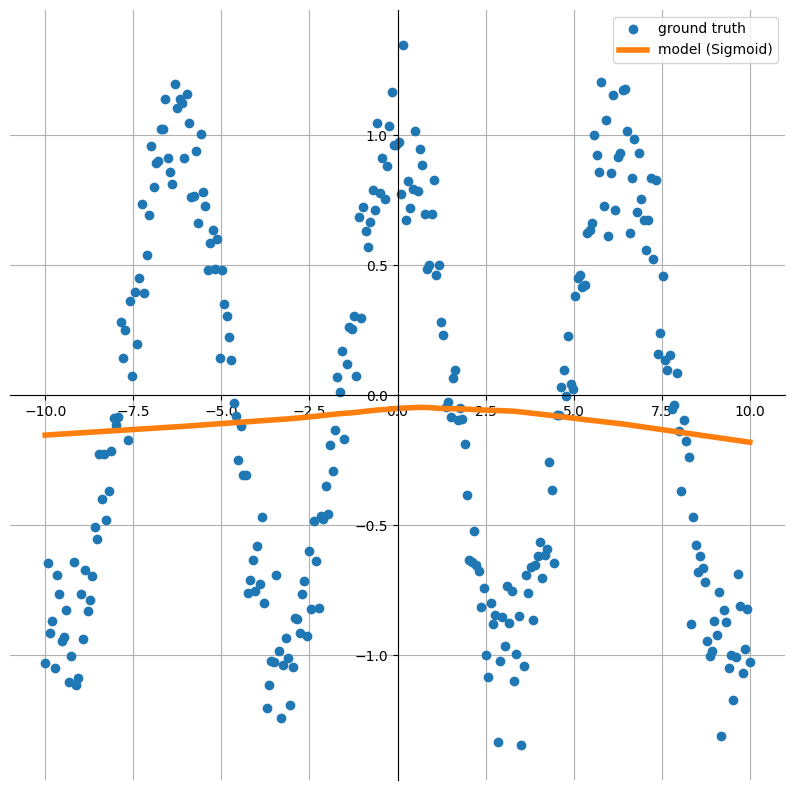

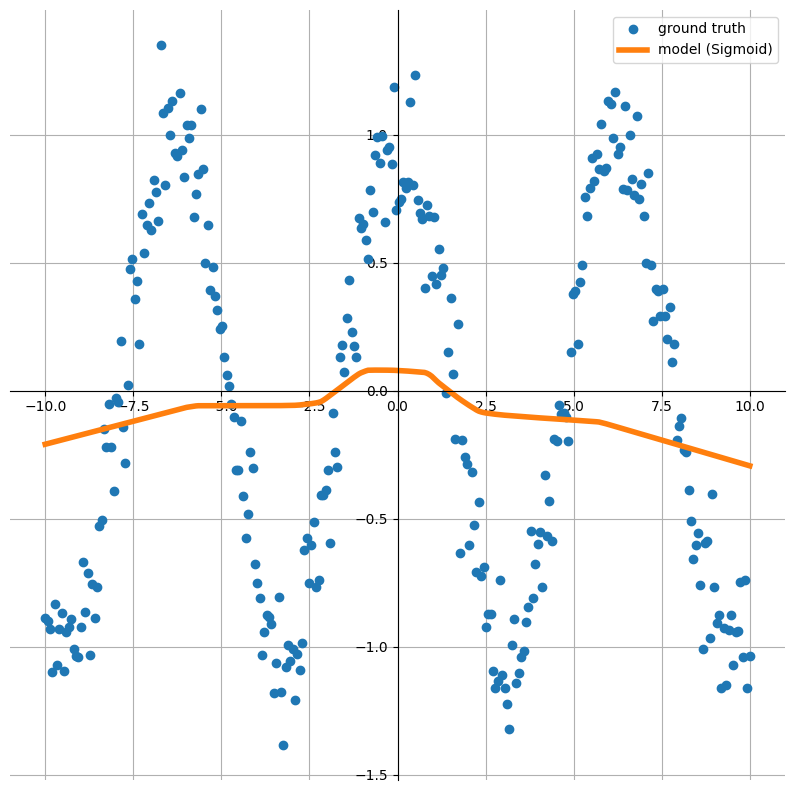

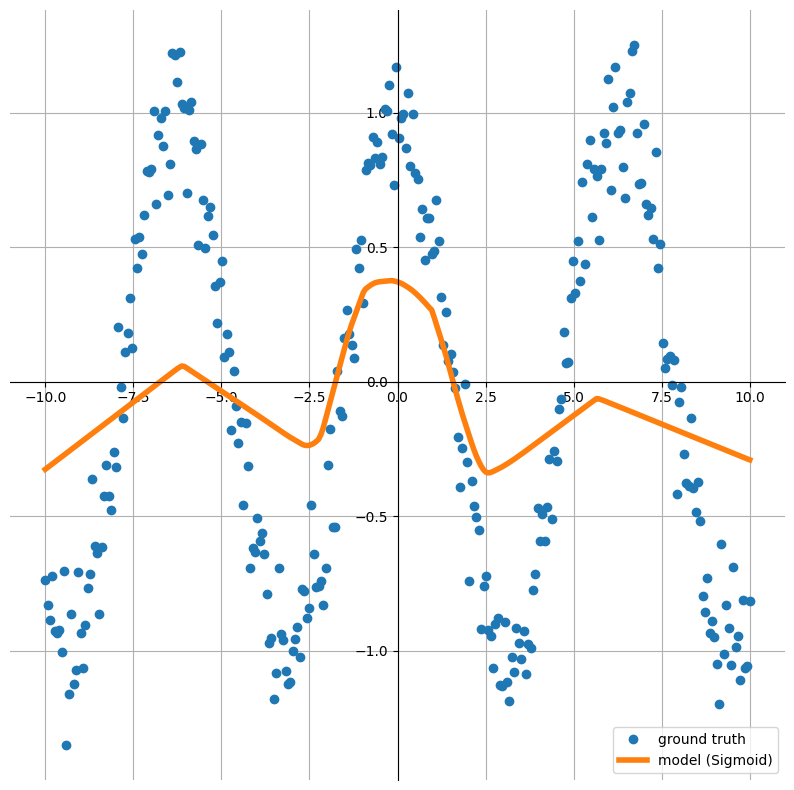

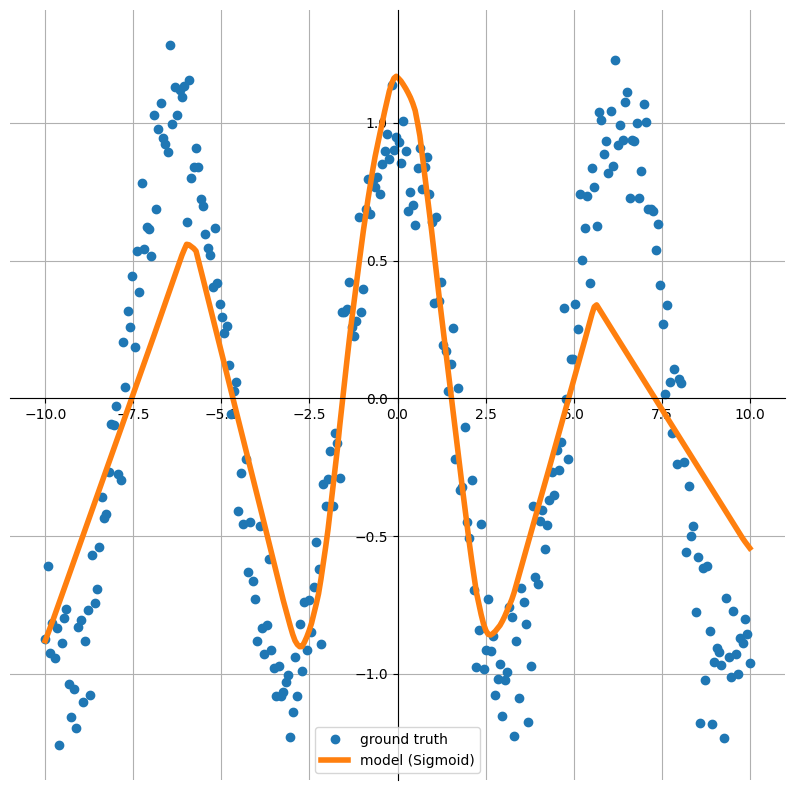

...

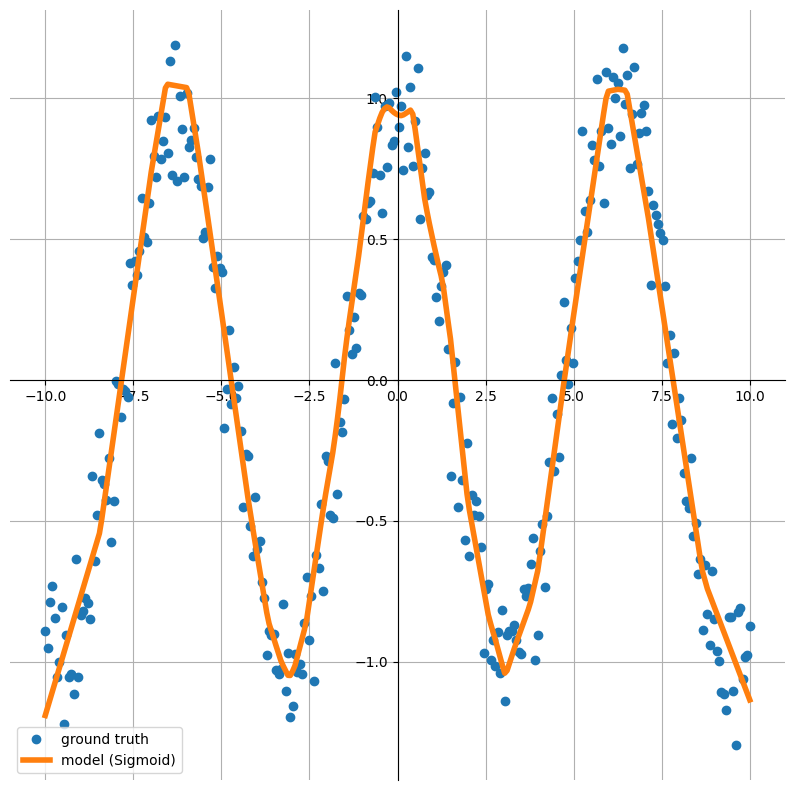

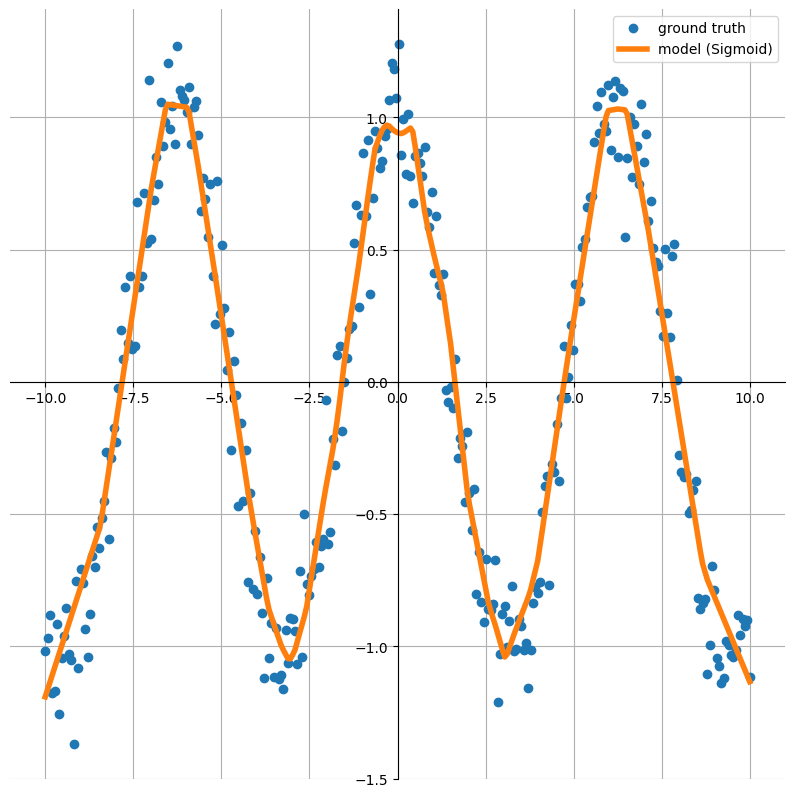

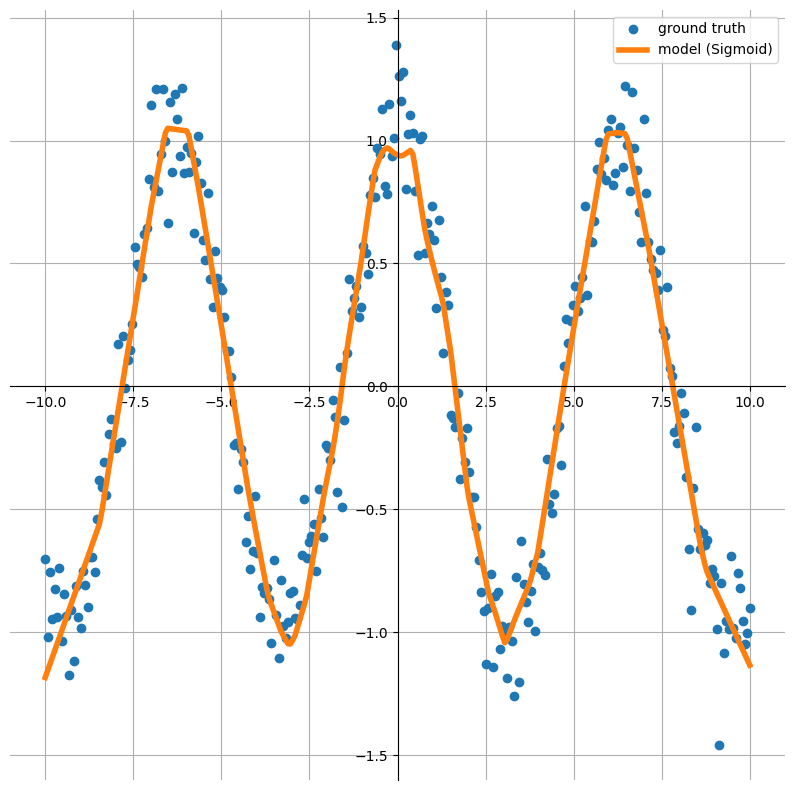

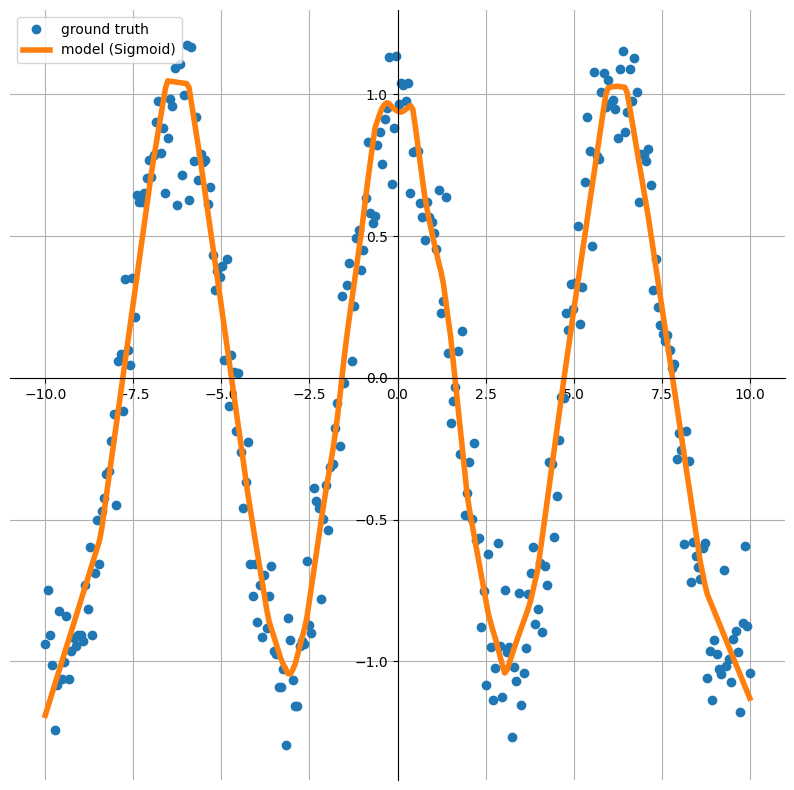

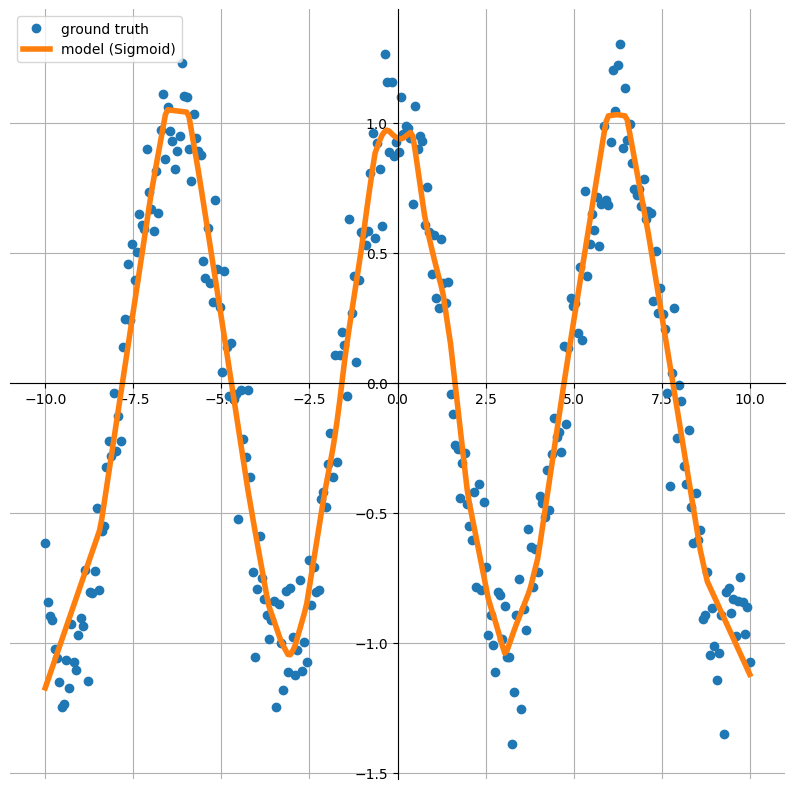

In [64]:
from my_mlp import *

#build computational graph
model = GraphNetwork(
 	Linear(1, 128),
    ReLU(),
    Linear(128,64),
    ReLU(),
    Linear(64, 32),
    ReLU(),
    Linear(32,8),
    ReLU(),
    Linear(8,1),
)

#build loss function
loss = MSE(model.last_node)
show(loss)

#build optmizer 
optimizer = Adam(model.parameters())

#Load dataset
line = lambda x: np.cos(x) + 0.15*np.random.randn()
interval = (-10, 10)
train_nsamples = 1000
test_nsamples = 100
train_dataset = AlgebraicDataset(line, interval, train_nsamples)
test_dataset = AlgebraicDataset(line, interval, test_nsamples)

batch_size = 16
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

#train 
epochs = 1001

# Let''s make a Gif of the training
filename_output = "./my_mlp_regression.gif"
writer = imageio.get_writer(filename_output, mode='I', duration=0.3)

for t in range(epochs):
  train_loss = train(model, train_dataloader, loss, optimizer)
  if t % 25 == 0:
    print(f"Epoch: {t}; Train Loss: {train_loss}")
    image = plot_comparison(line, model)
    # appending to gif
    writer.append_data(image)

test_loss = test(model, test_dataloader, loss)
print(f"Test Loss: {test_loss}")
writer.close()



## 1.2 Multilayer Perceptron

Multilayer Perceptron is a fully connected class of neural networks which presents multiple perceptrons connected in a computational graph that "flows" from inputs to outputs.

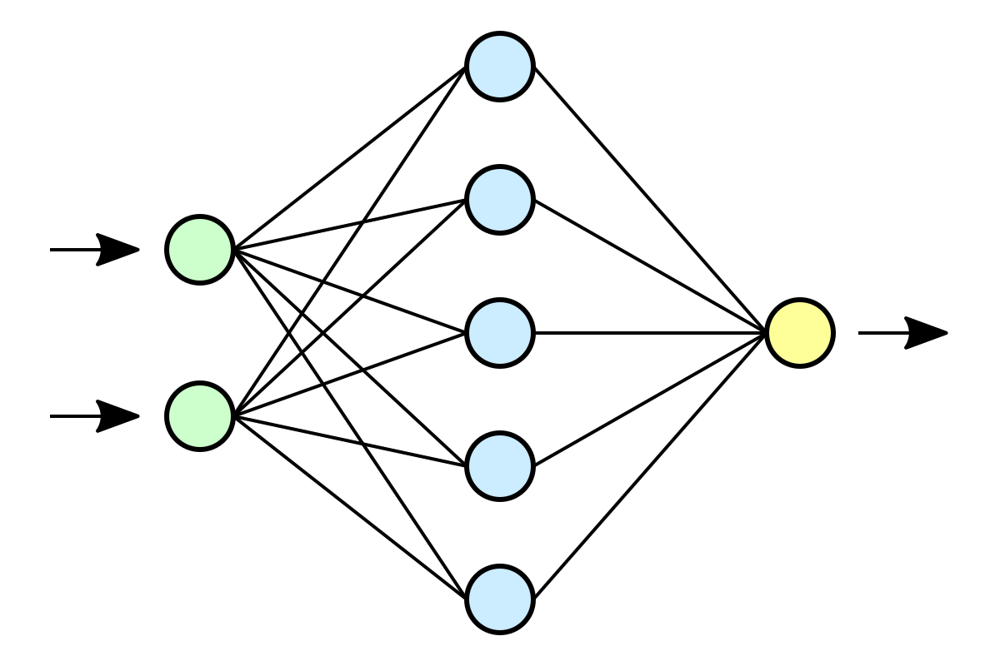

# 2. How can we build a MLP network in PyTorch?

In [ ]:
import torch
import numpy as np
from torch import nn

In [ ]:
class LineNetwork(nn.Module):
  # Initialization
  def __init__(self):
    super().__init__()
    # a single perceptron
    self.layers = nn.Sequential(
        nn.Linear(1, 1),
    )

  # how the network operates
  def forward(self, x):
    return self.layers(x)

# 3. How can we train a neural network?

Let's train our network to regress a simple affine function. A single Perceptron should be able to approximate a line, right?

## 3.1 Preparing the data infrastructure

In [ ]:
from torch.utils.data import Dataset, DataLoader
import torch.distributions.uniform as urand

In [ ]:
# This is a Dataset class to work with PyTorch
class AlgebraicDataset(Dataset):
  '''Abstraction for a dataset of a 1D function'''

  def __init__(self, f, interval, nsamples):
    X = urand.Uniform(interval[0], interval[1]).sample([nsamples])
    self.data = [(x, f(x)) for x in X]

  def __len__(self):
    return len(self.data)

  def __getitem__(self, idx):
    return self.data[idx]

In [ ]:
# we need a function
line = lambda x: 2*x + 3
# a domain for our function
interval = (-10, 10)
# the number of points we are going to sample for training
train_nsamples = 1000
# the number of points we are going to evaluate our model on
test_nsamples = 100

In [ ]:
train_dataset = AlgebraicDataset(line, interval, train_nsamples)
test_dataset = AlgebraicDataset(line, interval, test_nsamples)

train_dataloader = DataLoader(train_dataset, batch_size=train_nsamples, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=test_nsamples, shuffle=True)

# 3.2 Hyperparameters for Optimization

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"running on {device}")

running on cpu


In [ ]:
model = LineNetwork().to(device)

In [ ]:
# Loss Function: Mean Squared Error
lossfunc = nn.MSELoss()
# SGD = Stochastic Gradient Descent
# lr = learning rate
optimizer = torch.optim.SGD(model.parameters(), lr=1e-3)

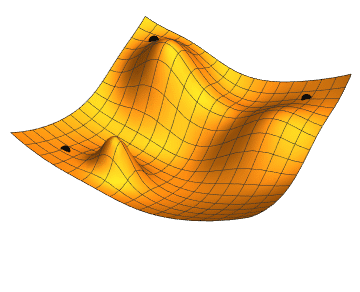

In [ ]:
def train(model, dataloader, lossfunc, optimizer):
  '''A function for training our model'''

  model.train()
  cumloss = 0.0
  for X, y in dataloader:
    X = X.unsqueeze(1).float().to(device)
    y = y.unsqueeze(1).float().to(device)

    pred = model(X)
    loss = lossfunc(pred, y)

    # we need to "clean" the accumulated gradients
    optimizer.zero_grad()
    # computes gradients
    loss.backward()
    # updates parameters going in the direction that decreases the local error
    optimizer.step()

    # loss is a tensor so we use *item* to get the underlying float value
    cumloss += loss.item() 
  
  return cumloss / len(dataloader)


def test(model, dataloader, lossfunc):
  '''A function for evaluating our model on test data'''
  model.eval()
  
  cumloss = 0.0
  with torch.no_grad():
    for X, y in dataloader:
      X = X.unsqueeze(1).float().to(device)
      y = y.unsqueeze(1).float().to(device)

      pred = model(X)
      loss = lossfunc(pred, y)
      cumloss += loss.item() 
  
  return cumloss / len(dataloader)

# 3.3 Training the network



In [ ]:
# for visualization
import imageio
import matplotlib.pyplot as plt
from skimage import img_as_ubyte

In [ ]:
# To visualize results
def plot_comparison(f, model, interval=(-10, 10), nsamples=300, return_array=True):
  fig, ax = plt.subplots(figsize=(10, 10))

  ax.grid(True, which='both')
  ax.spines['left'].set_position('zero')
  ax.spines['right'].set_color('none')
  ax.spines['bottom'].set_position('zero')
  ax.spines['top'].set_color('none')

  samples = np.linspace(interval[0], interval[1], nsamples)
  model.eval()
  with torch.no_grad():
    pred = model(torch.tensor(samples).unsqueeze(1).float().to(device))

  ax.plot(samples, list(map(f, samples)), "o", label="ground truth")
  ax.plot(samples, pred.cpu(), label="model",linewidth = 4.0)
  plt.legend()
  plt.show()
  # to return image as numpy array
  if return_array:
    fig.canvas.draw()
    img_from_plot = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
    return img_from_plot.reshape(fig.canvas.get_width_height()[::-1] + (3,))

Epoch: 0; Train Loss: 219.3954315185547


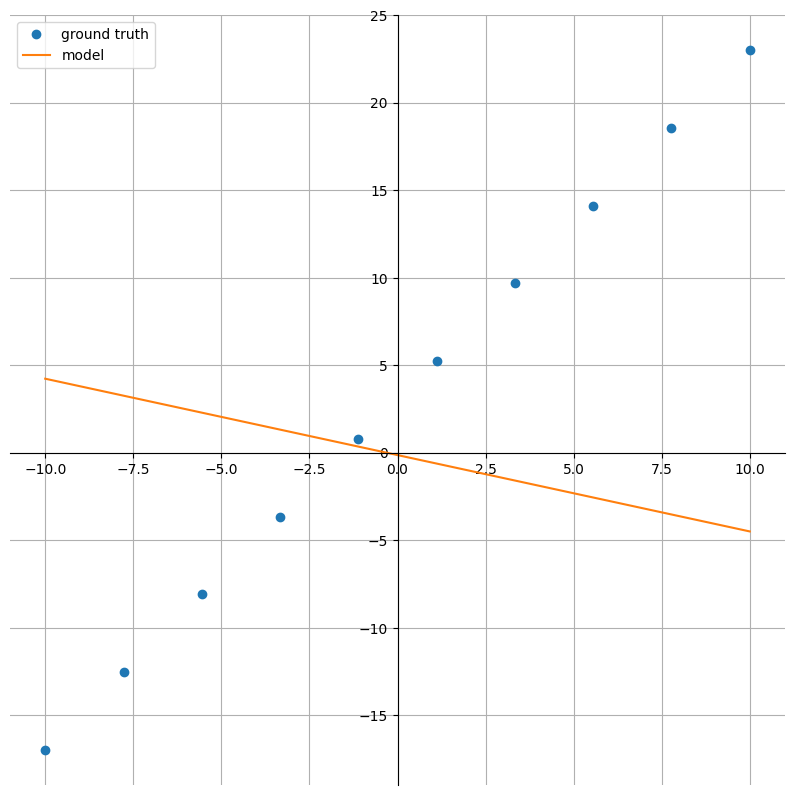

Epoch: 25; Train Loss: 17.261178970336914


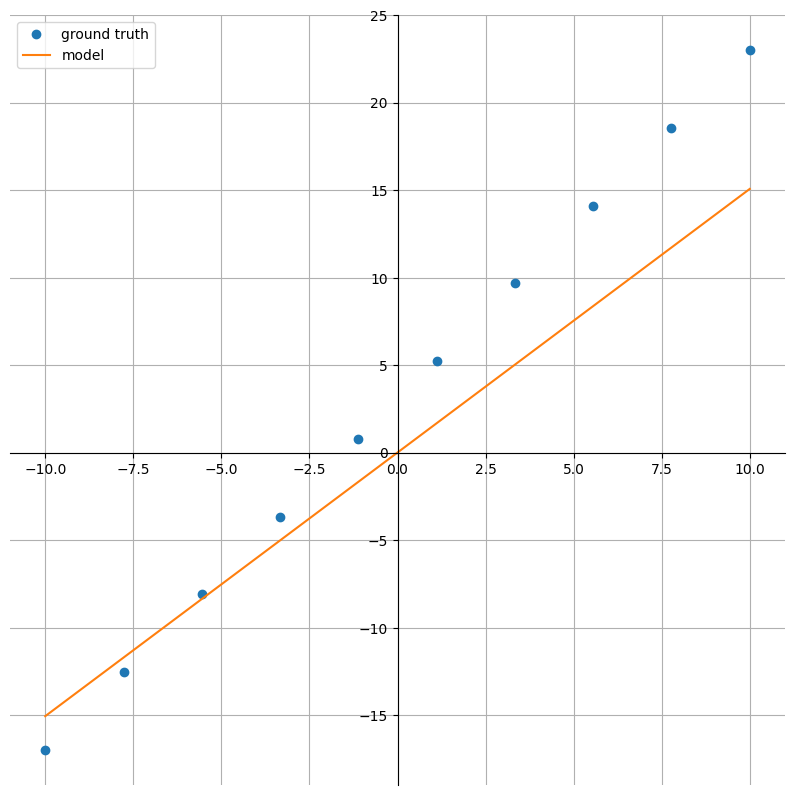

Epoch: 50; Train Loss: 8.516365051269531


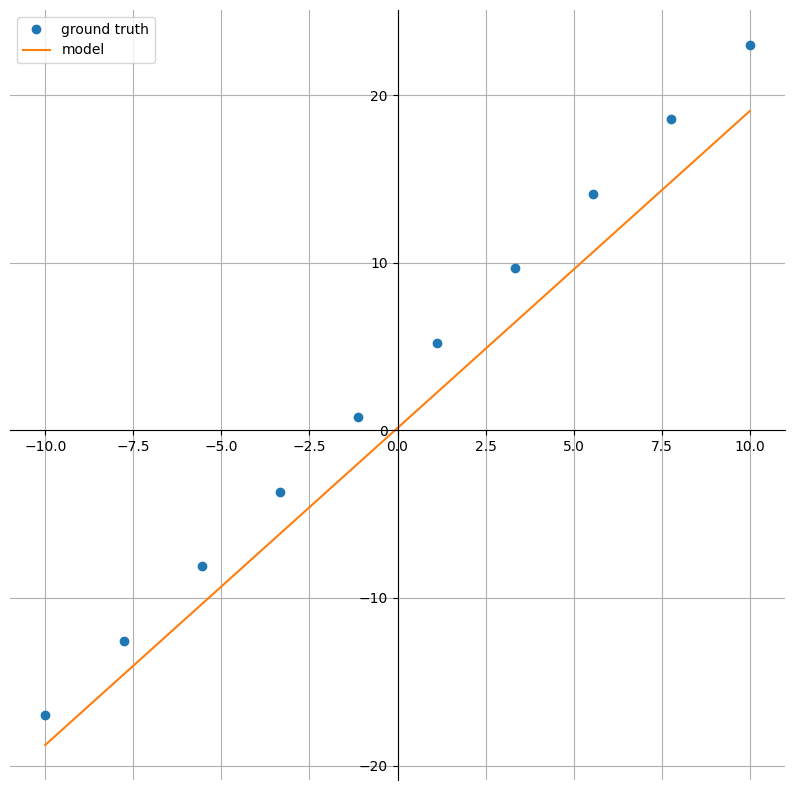

Epoch: 75; Train Loss: 7.427418231964111


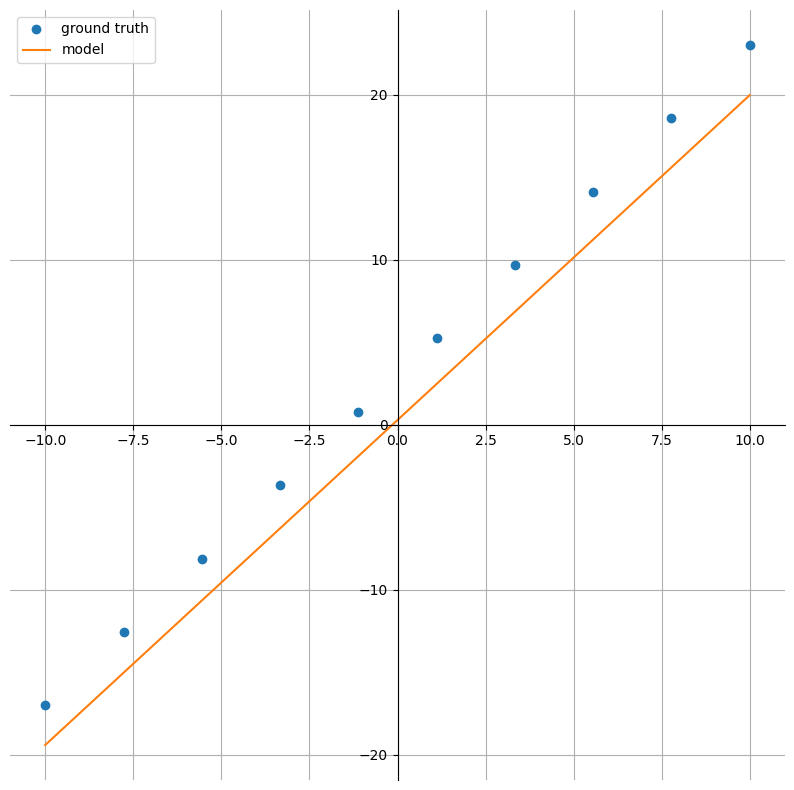

Epoch: 100; Train Loss: 6.709486484527588


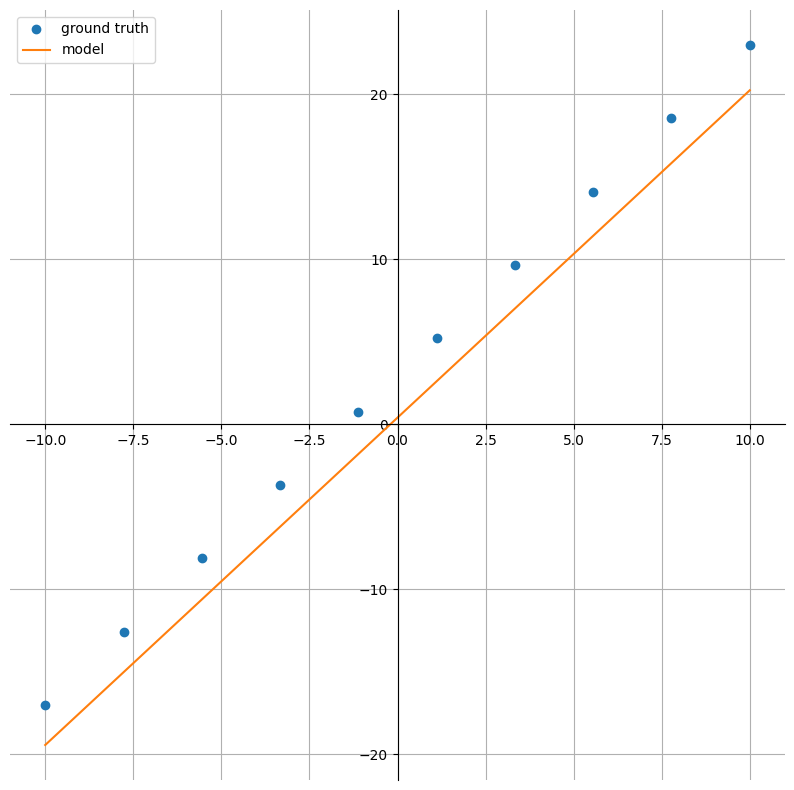

Epoch: 125; Train Loss: 6.070369243621826


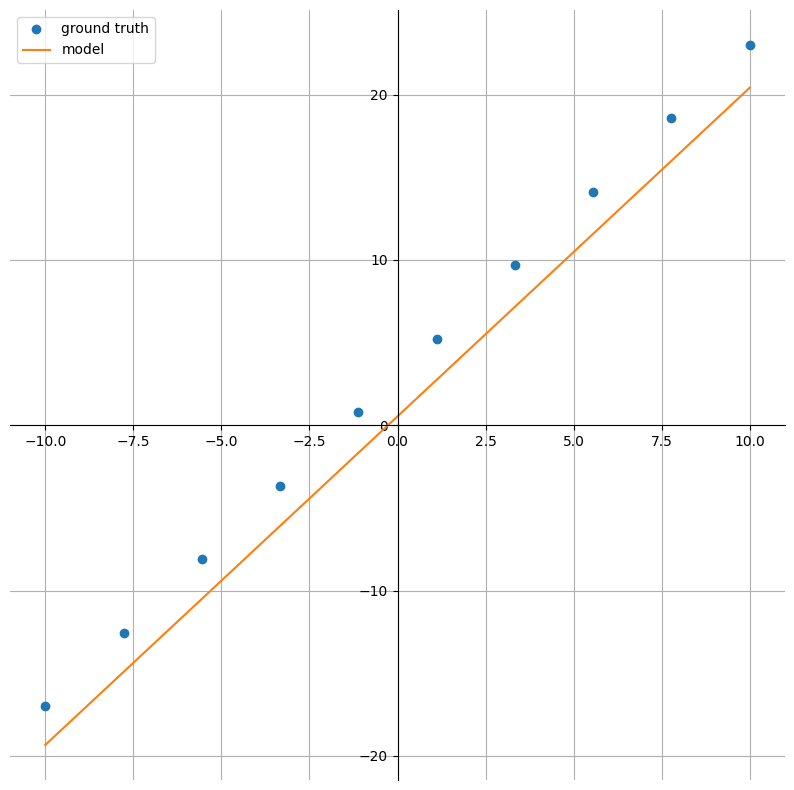

Epoch: 150; Train Loss: 5.492501258850098


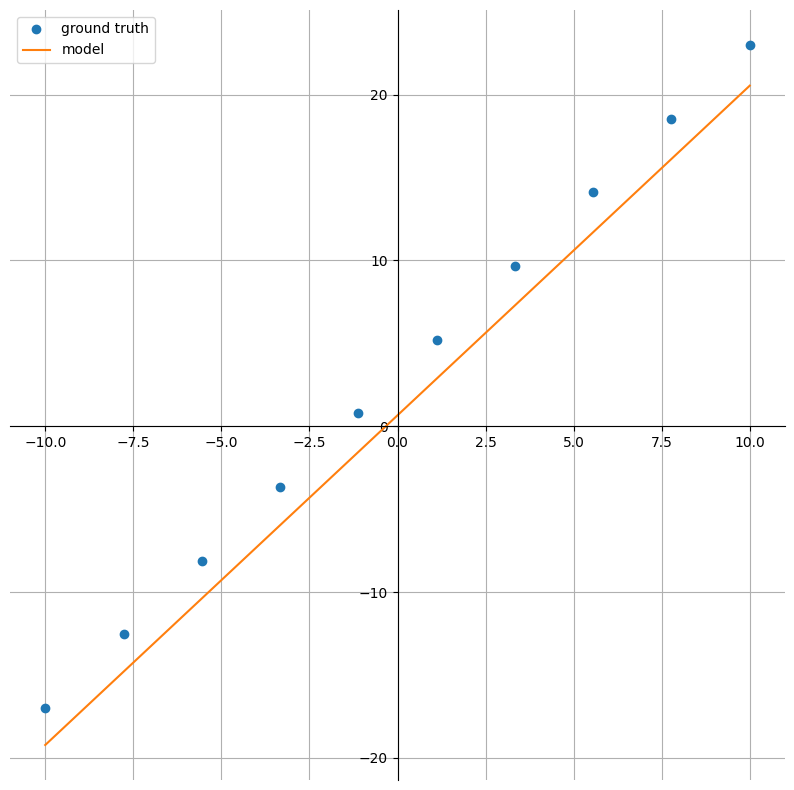

Epoch: 175; Train Loss: 4.969658851623535


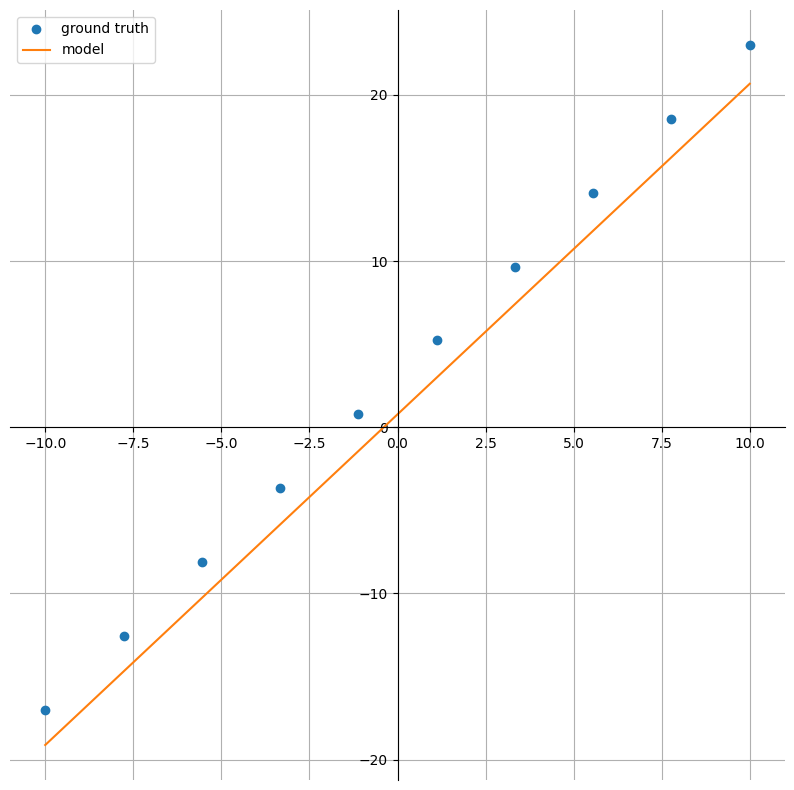

Epoch: 200; Train Loss: 4.49658727645874


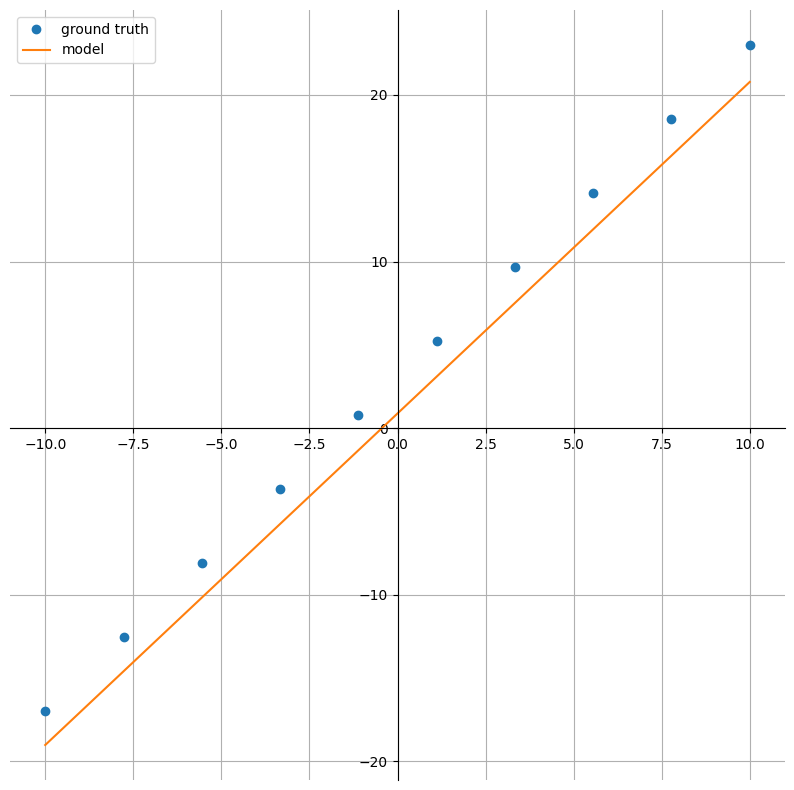

Epoch: 225; Train Loss: 4.068548202514648


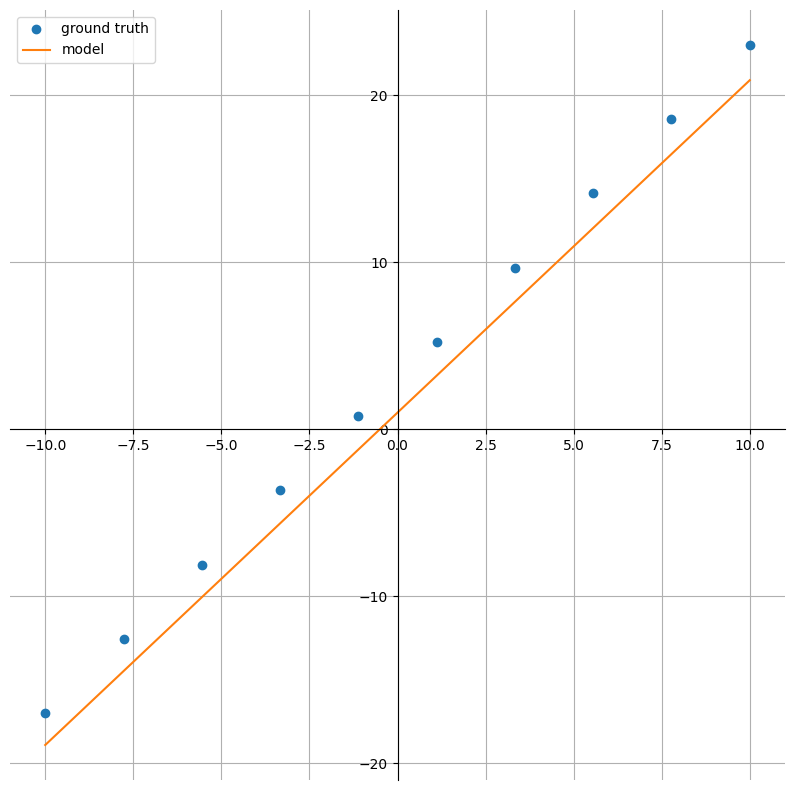

Epoch: 250; Train Loss: 3.6812548637390137


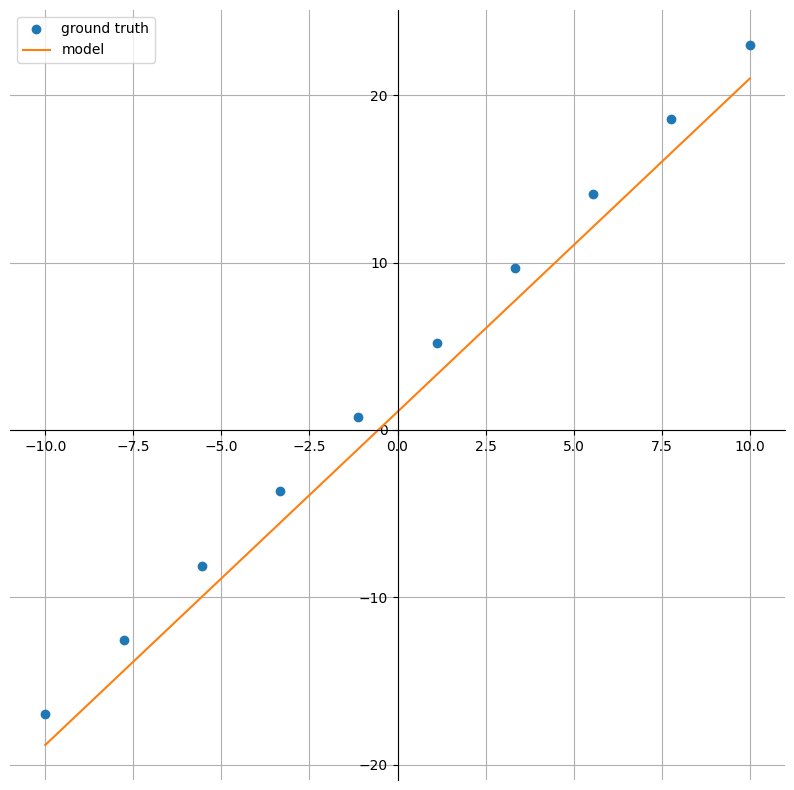

Epoch: 275; Train Loss: 3.33082914352417


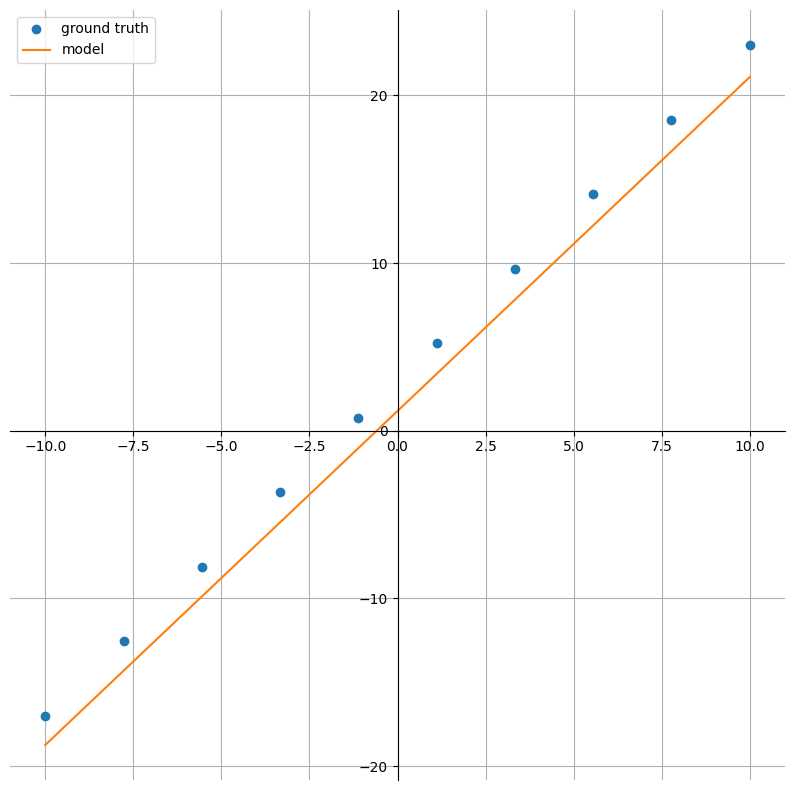

Epoch: 300; Train Loss: 3.013761281967163


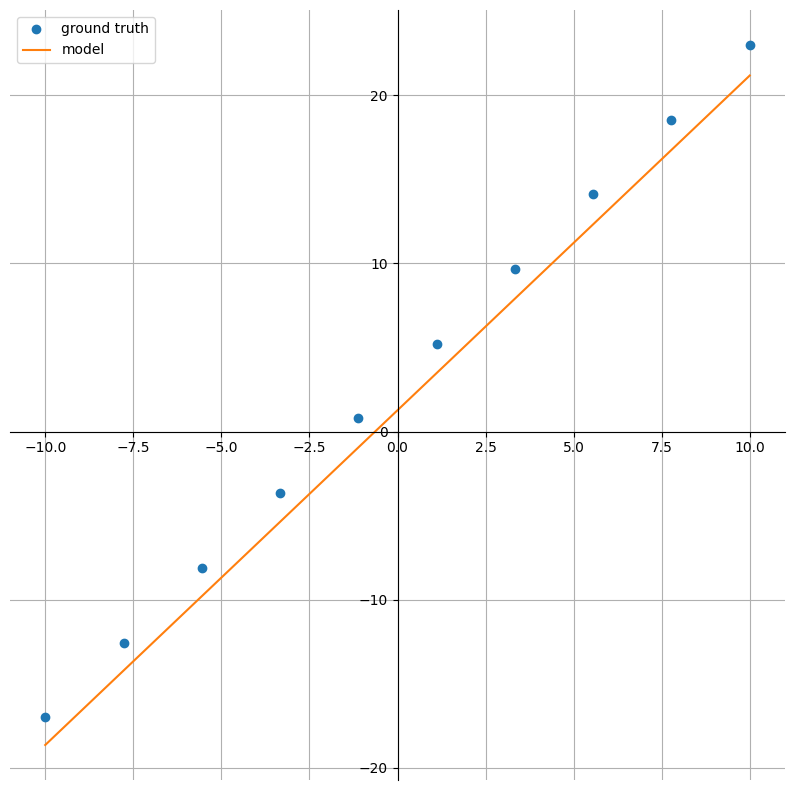

Epoch: 325; Train Loss: 2.726874828338623


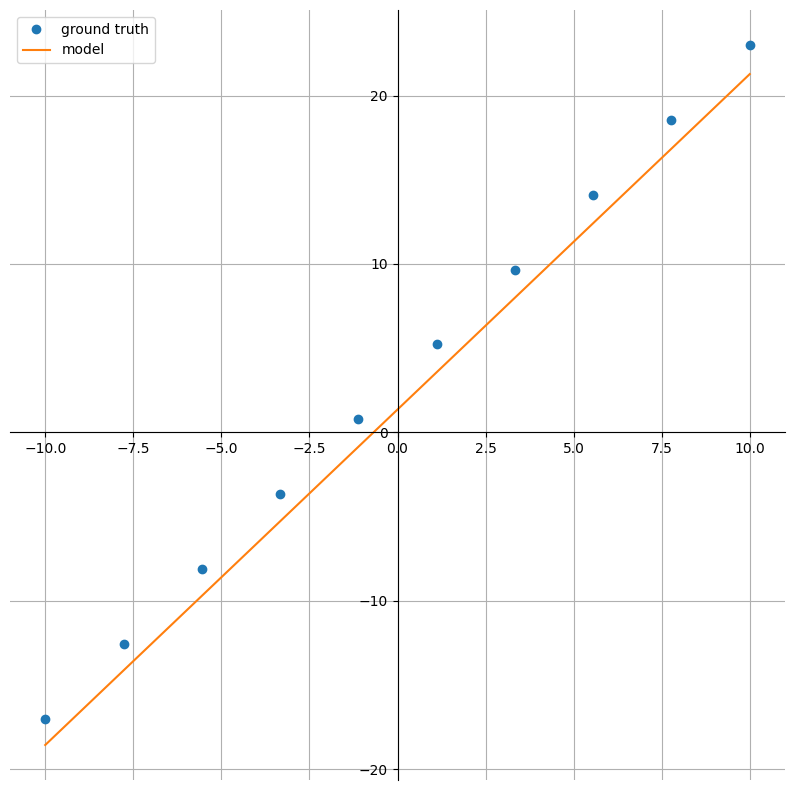

Epoch: 350; Train Loss: 2.467298746109009


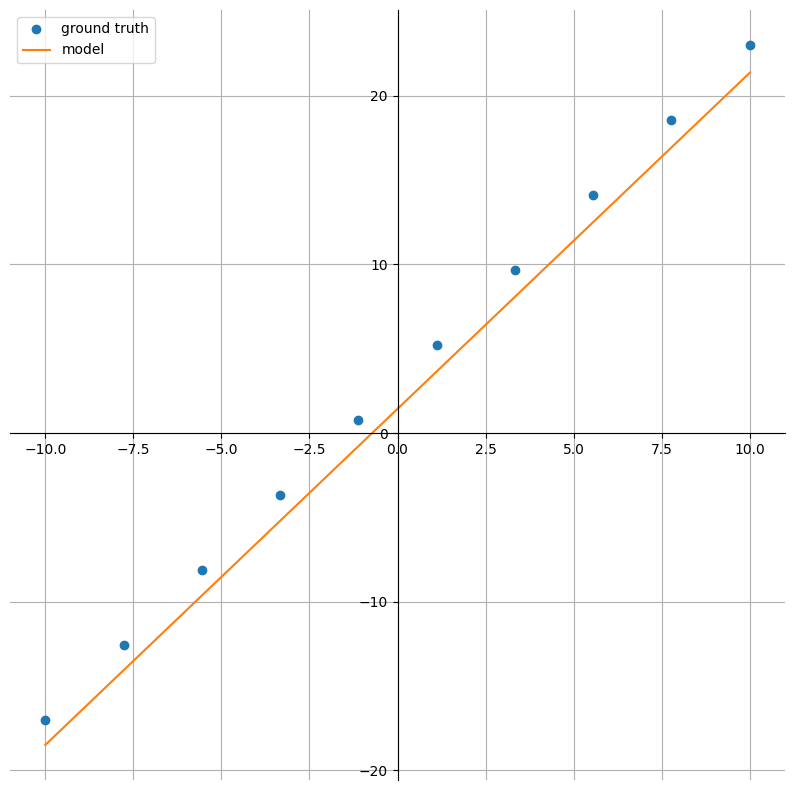

Epoch: 375; Train Loss: 2.232431173324585


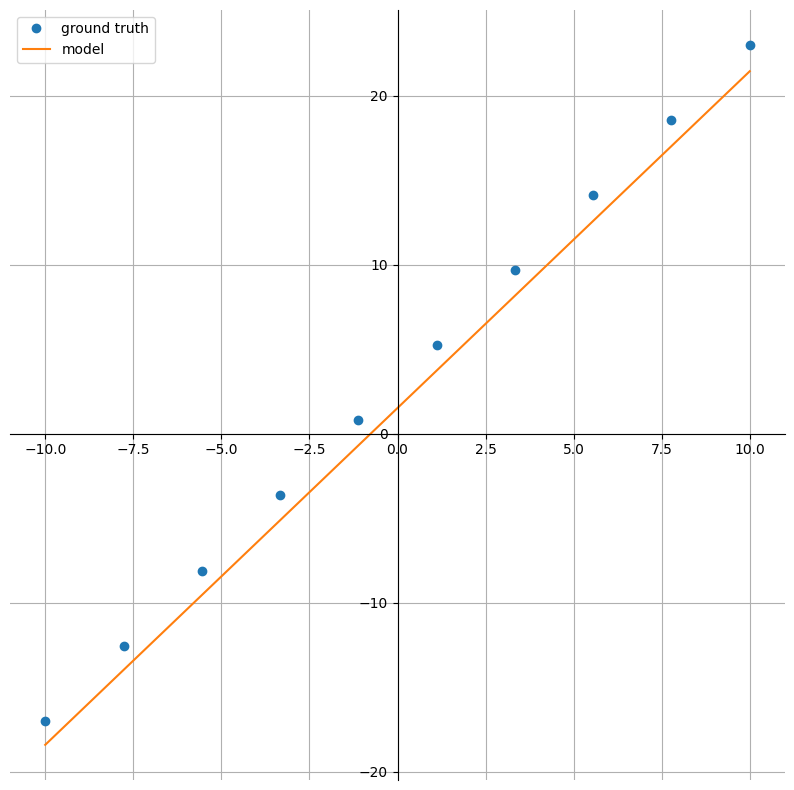

Epoch: 400; Train Loss: 2.019921064376831


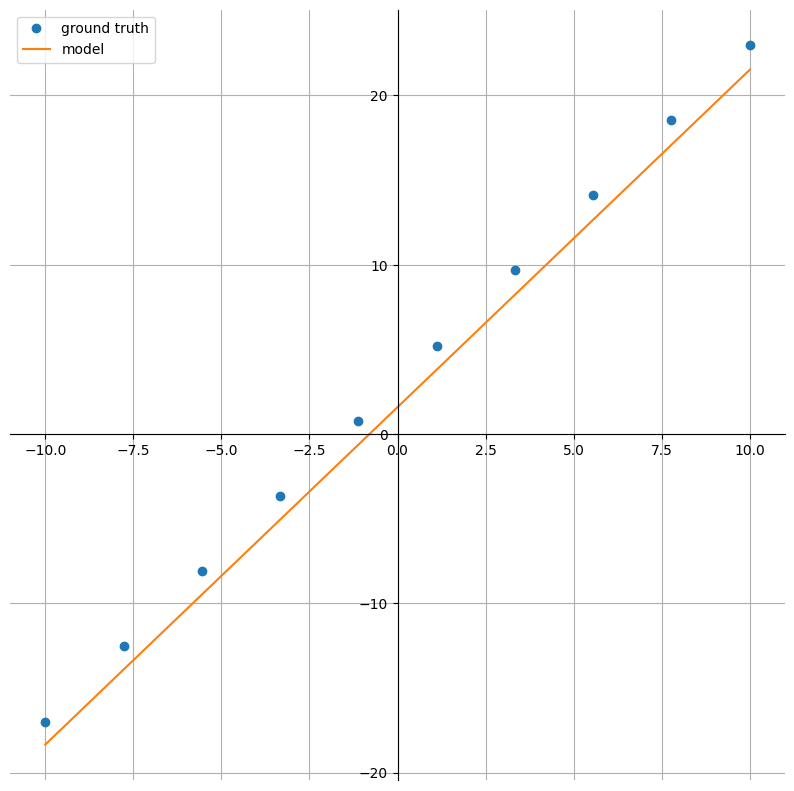

Epoch: 425; Train Loss: 1.827641248703003


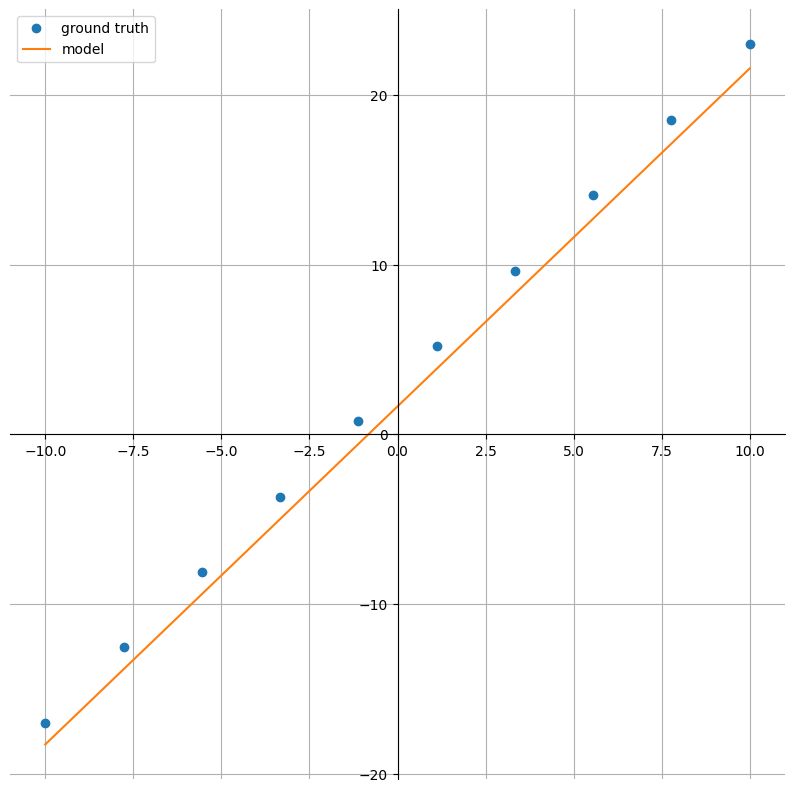

Epoch: 450; Train Loss: 1.653663992881775


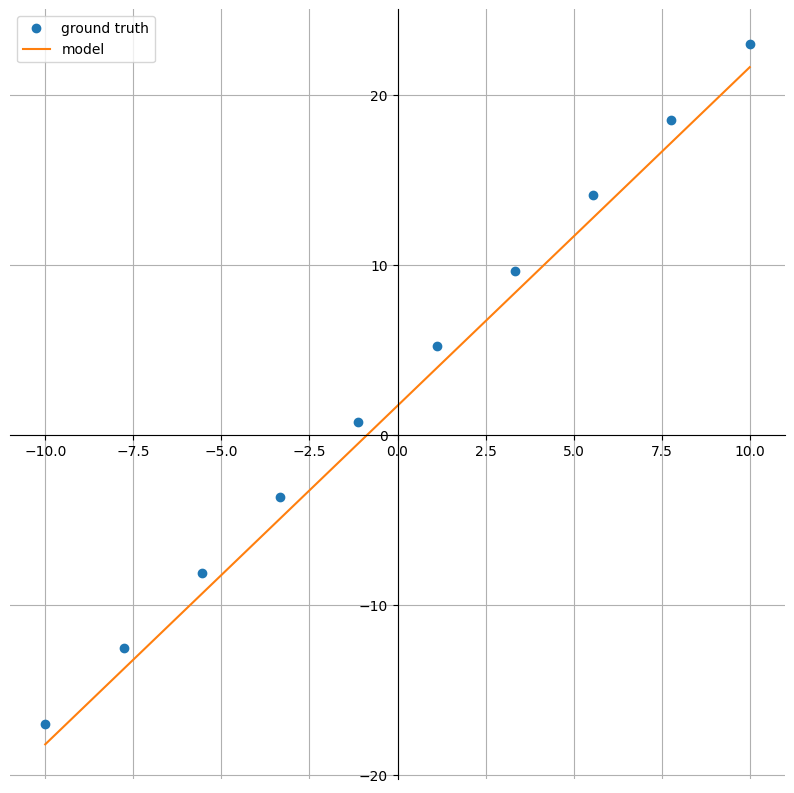

Epoch: 475; Train Loss: 1.4962483644485474


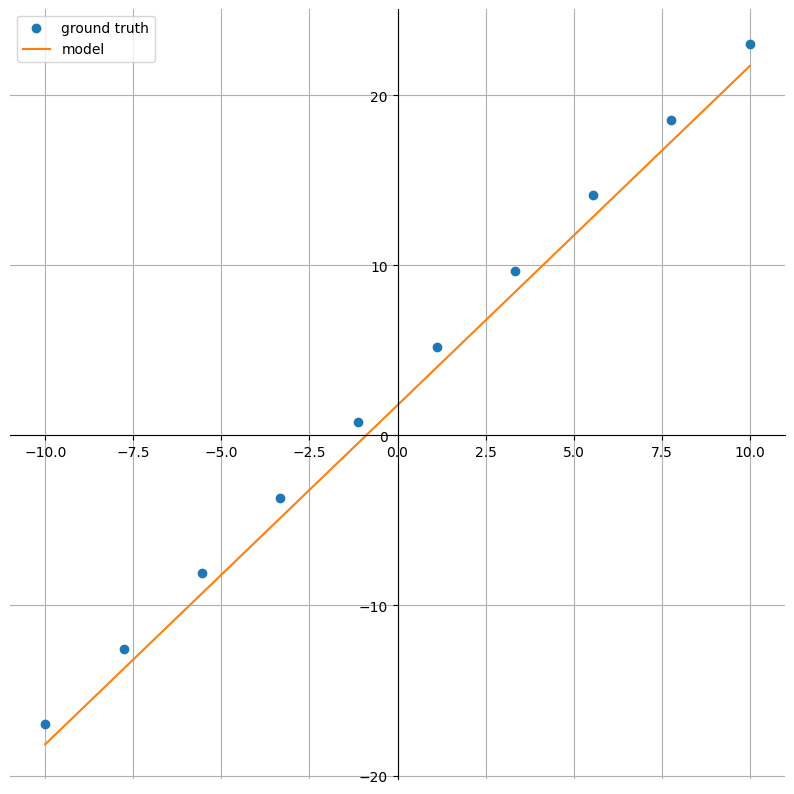

Epoch: 500; Train Loss: 1.3538178205490112


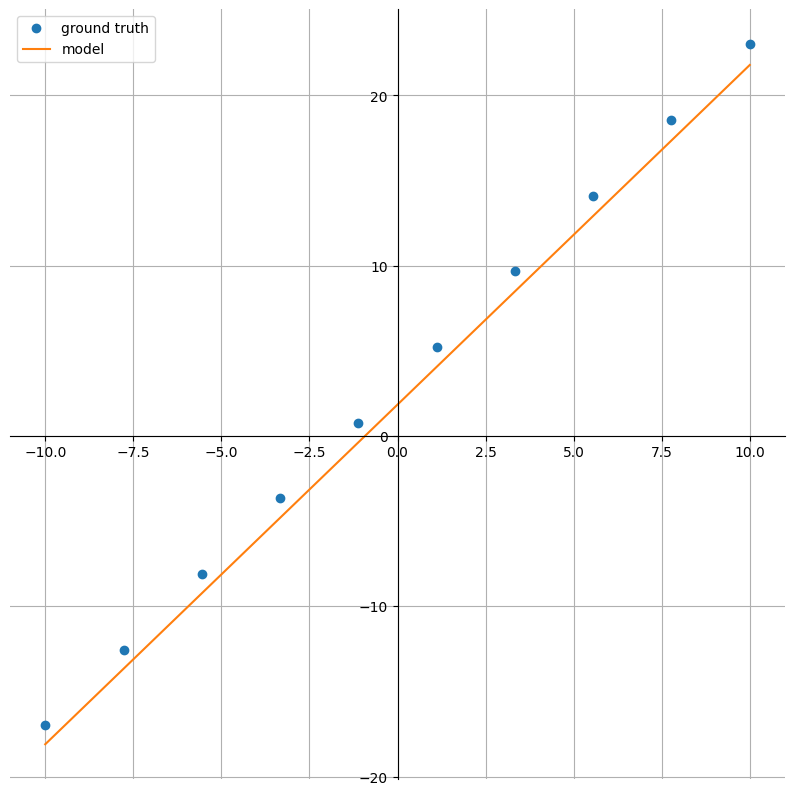

Epoch: 525; Train Loss: 1.2249451875686646


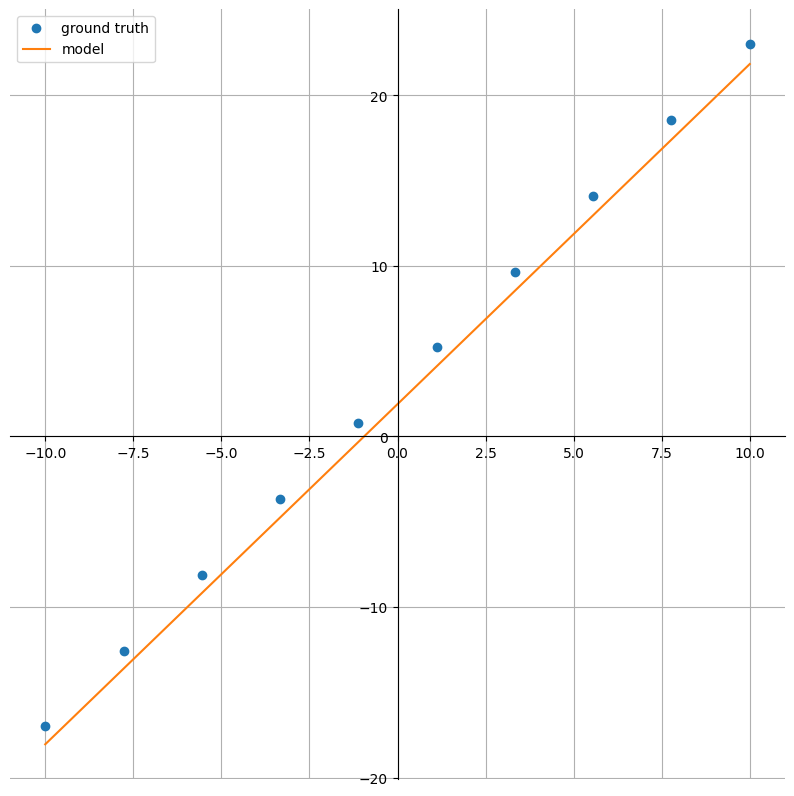

Epoch: 550; Train Loss: 1.108340859413147


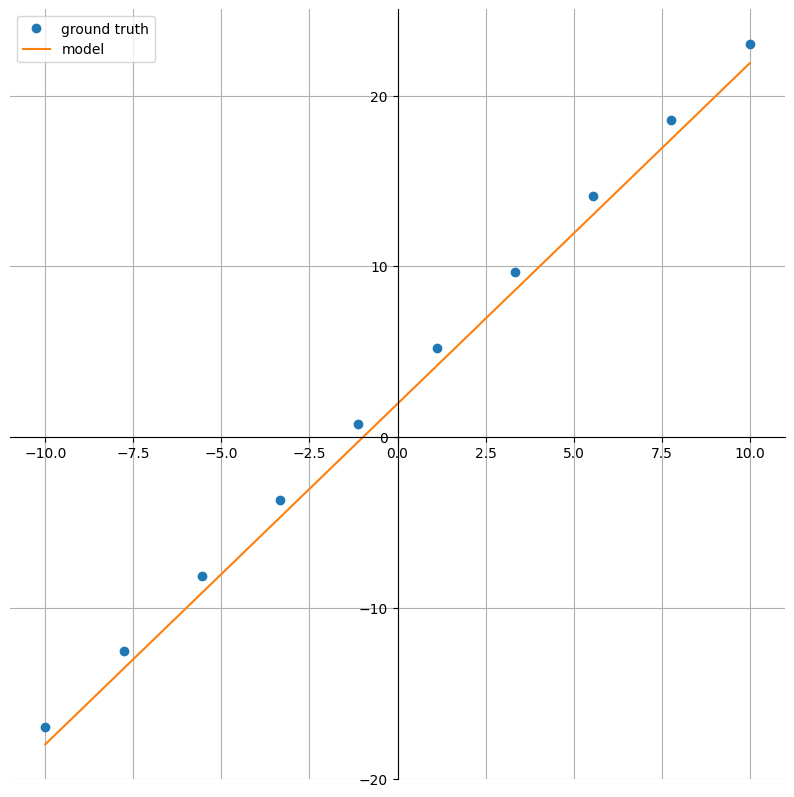

Epoch: 575; Train Loss: 1.0028350353240967


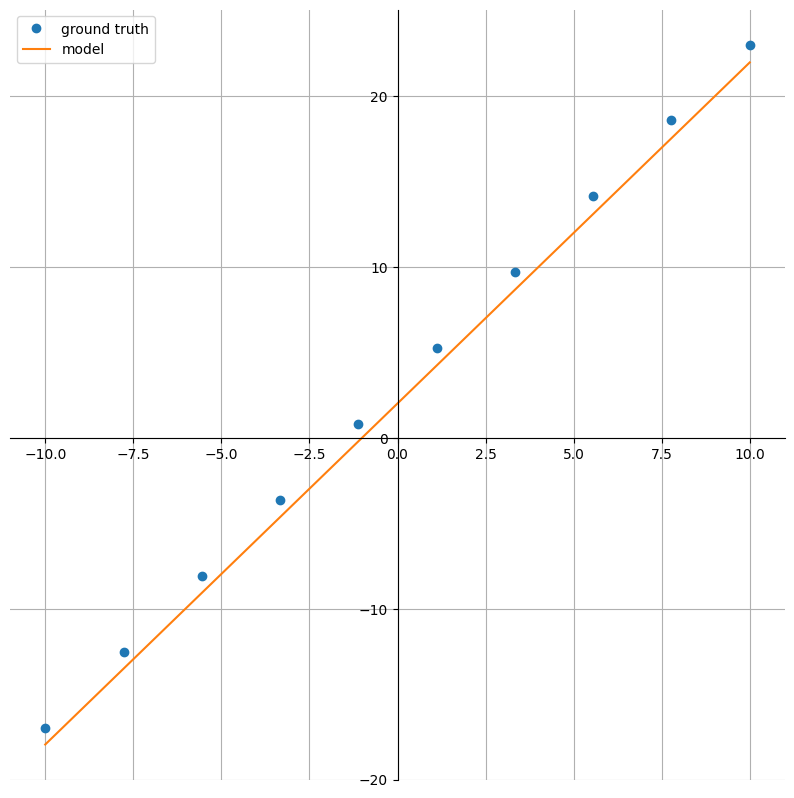

Epoch: 600; Train Loss: 0.9073733687400818


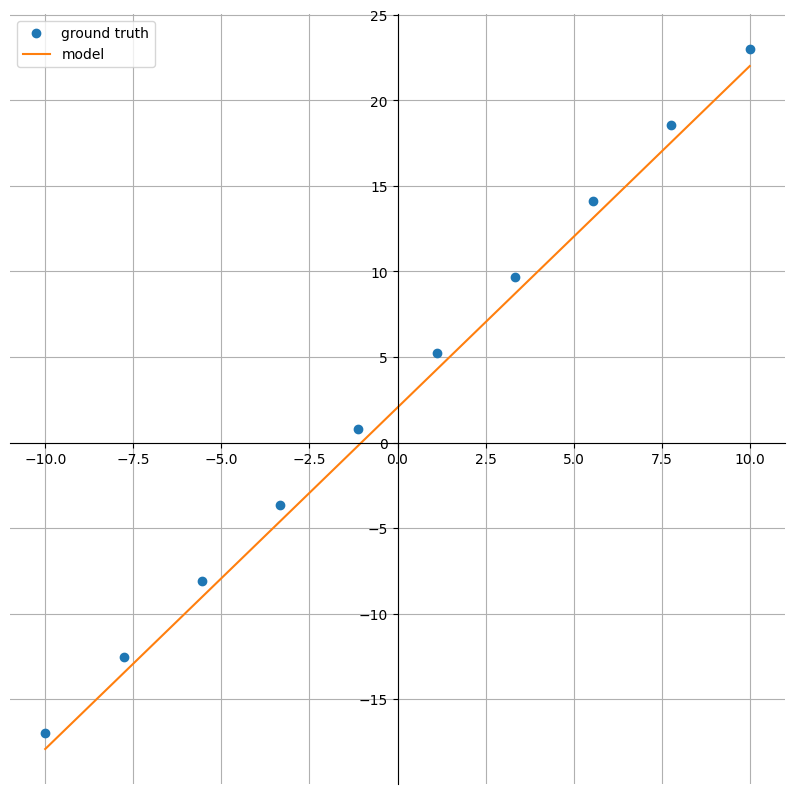

Epoch: 625; Train Loss: 0.8209985494613647


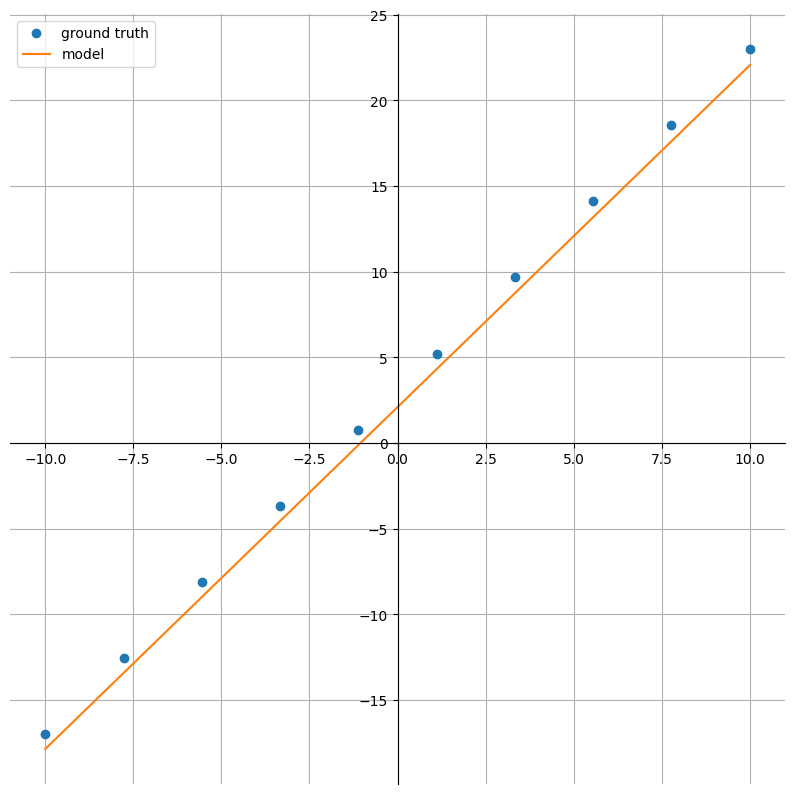

Epoch: 650; Train Loss: 0.7428446412086487


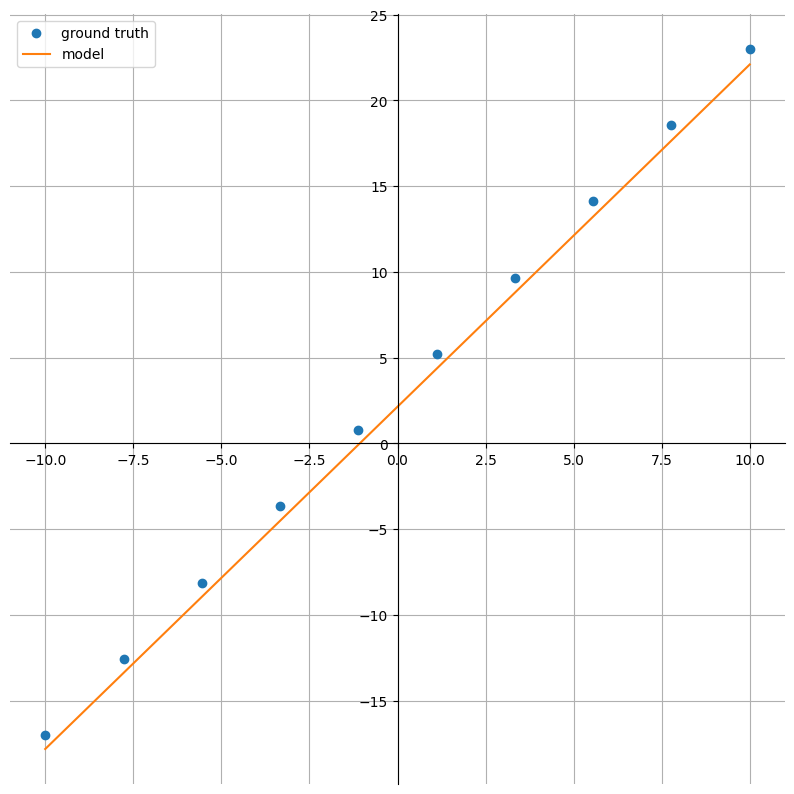

Epoch: 675; Train Loss: 0.6721318960189819


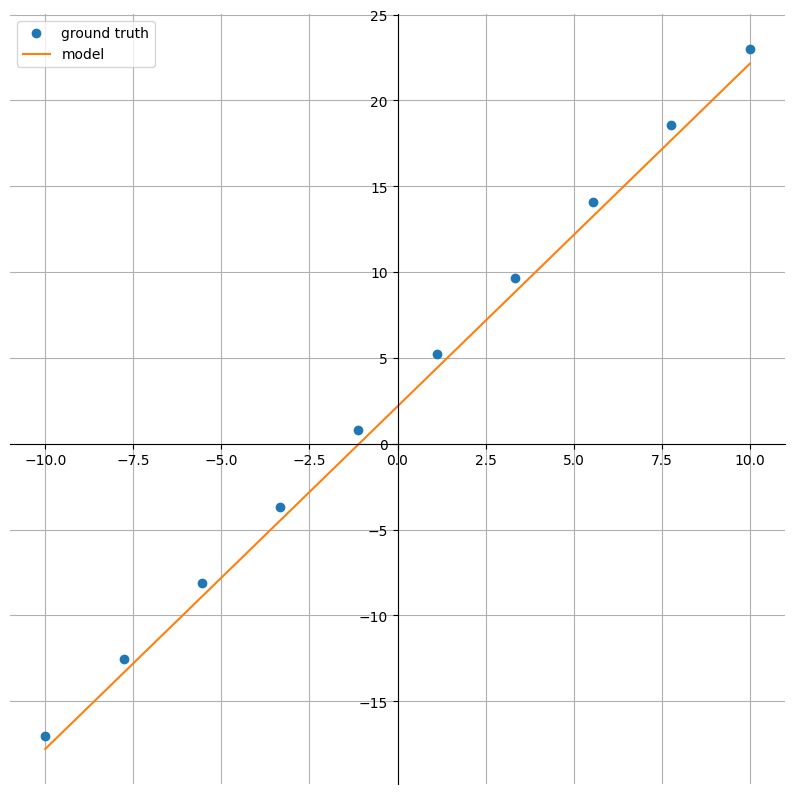

Epoch: 700; Train Loss: 0.6081502437591553


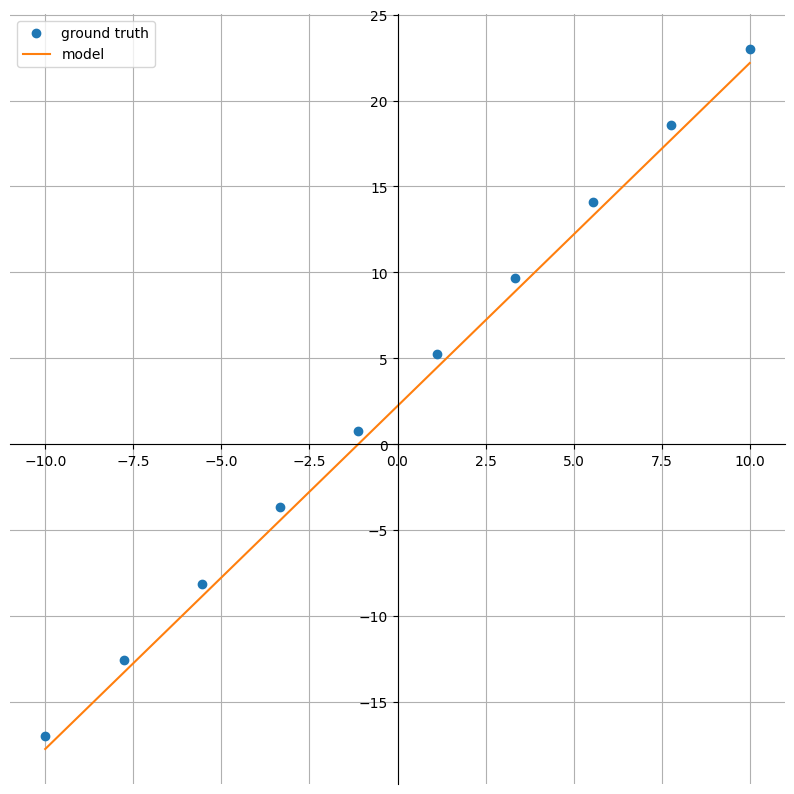

Epoch: 725; Train Loss: 0.5502603054046631


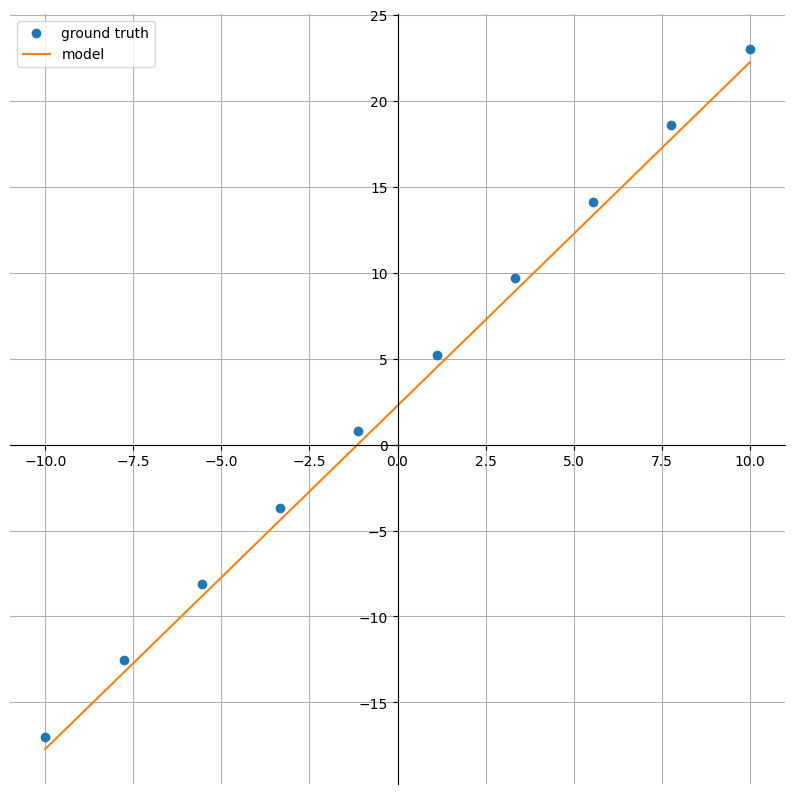

Epoch: 750; Train Loss: 0.4978799819946289


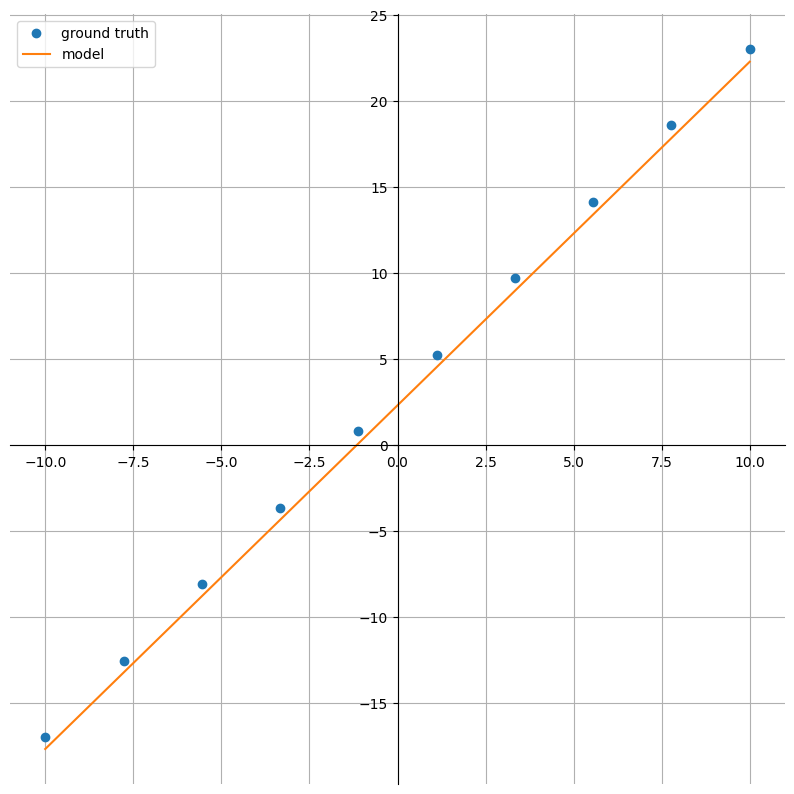

Epoch: 775; Train Loss: 0.4504854083061218


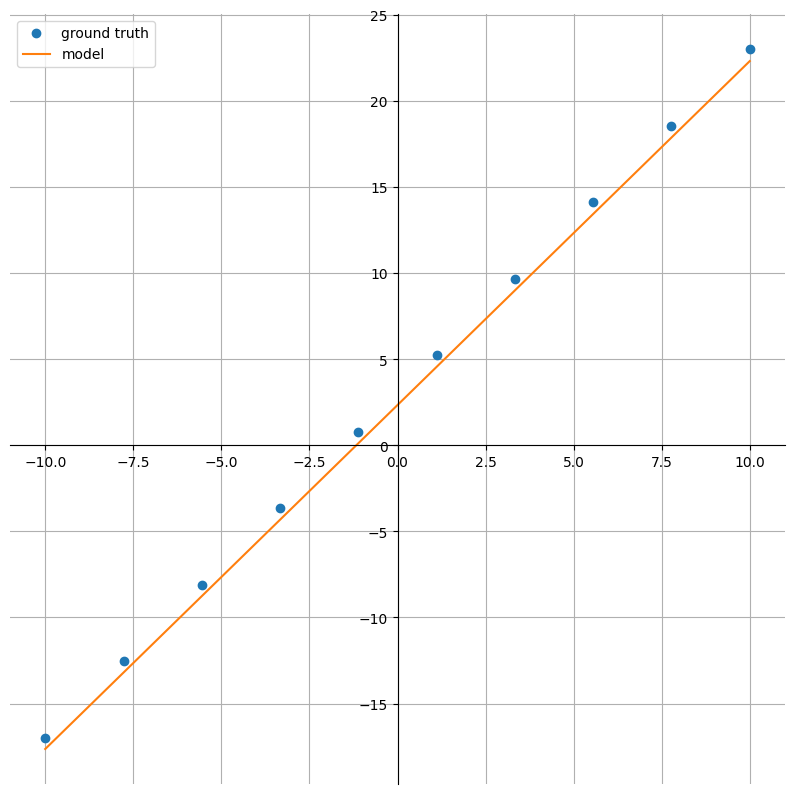

Epoch: 800; Train Loss: 0.4076029658317566


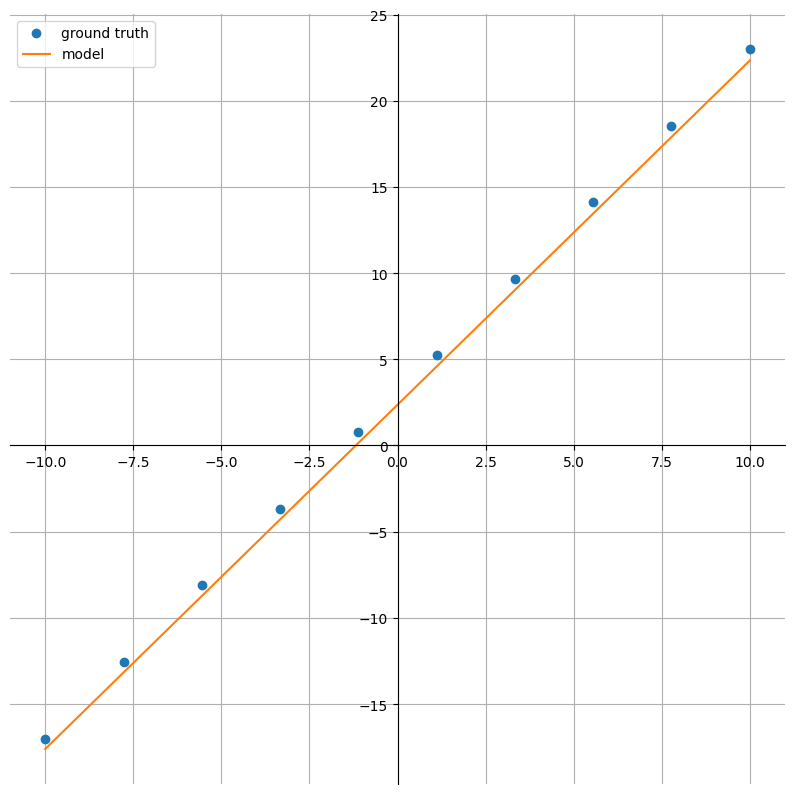

Epoch: 825; Train Loss: 0.36880266666412354


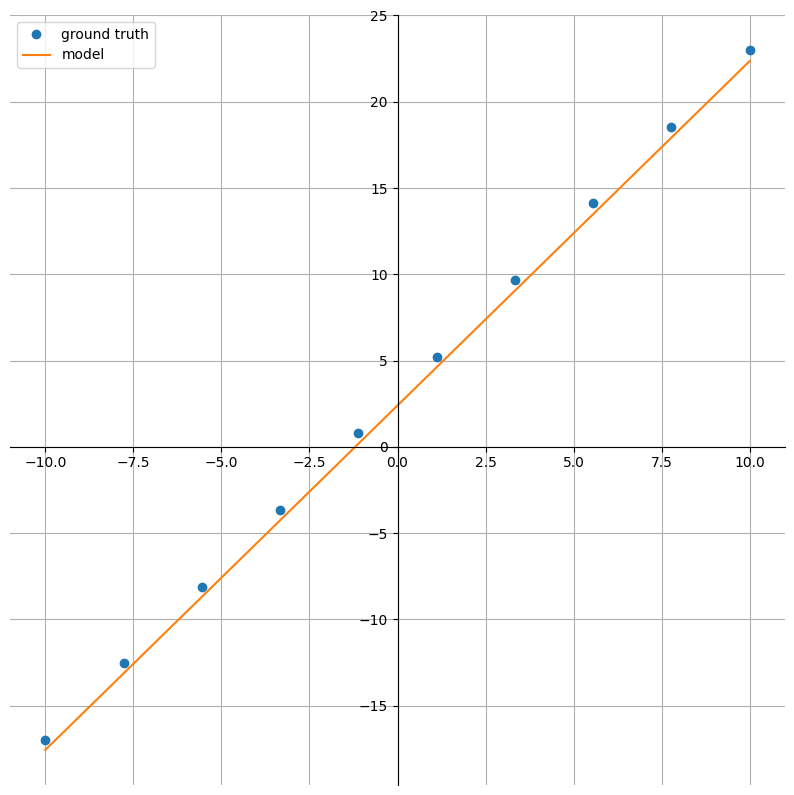

Epoch: 850; Train Loss: 0.3336951434612274


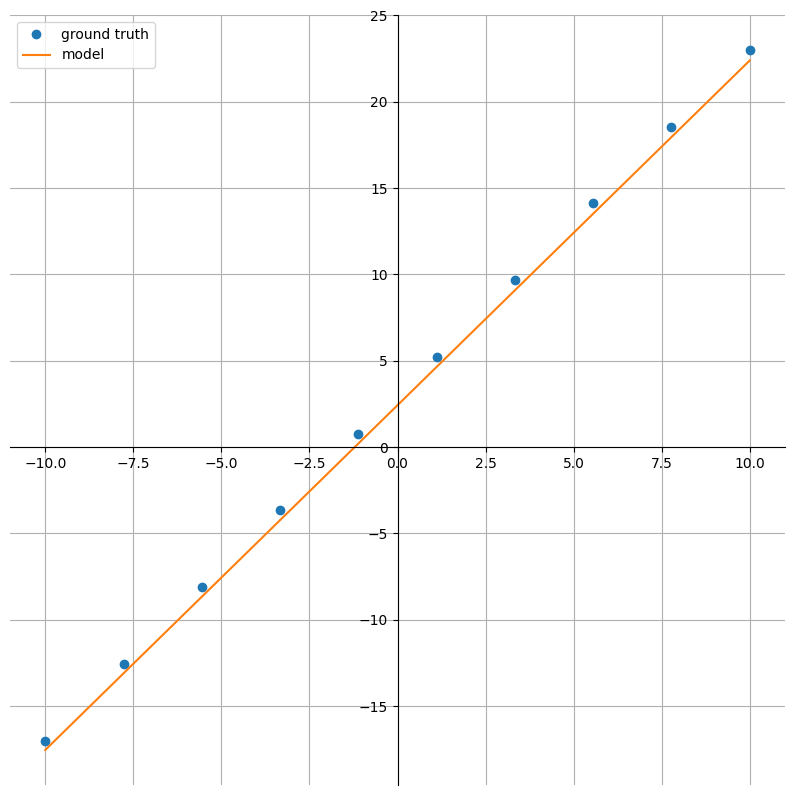

Epoch: 875; Train Loss: 0.3019302785396576


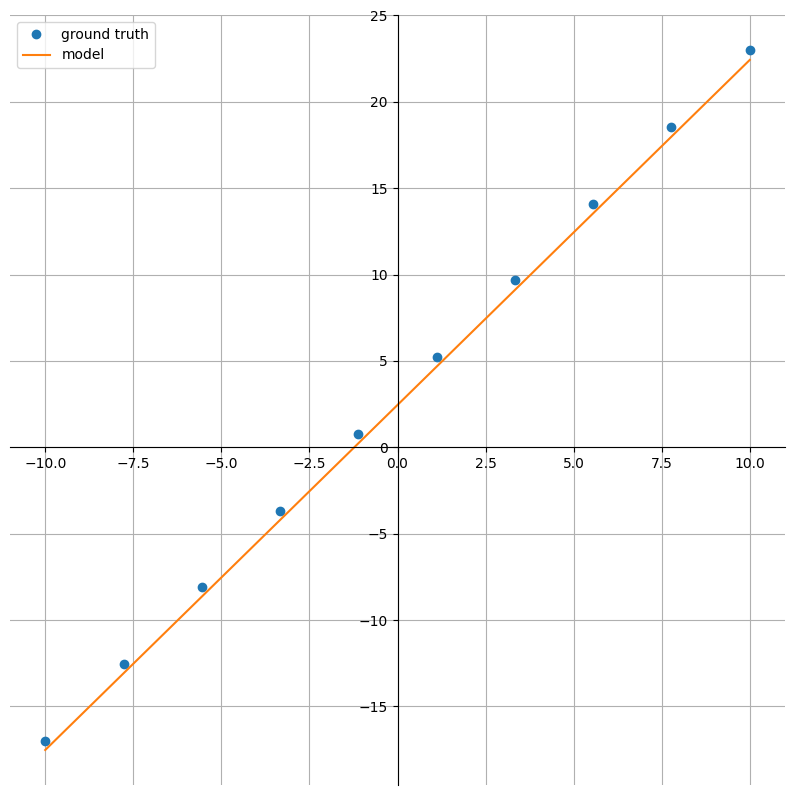

Epoch: 900; Train Loss: 0.27318814396858215


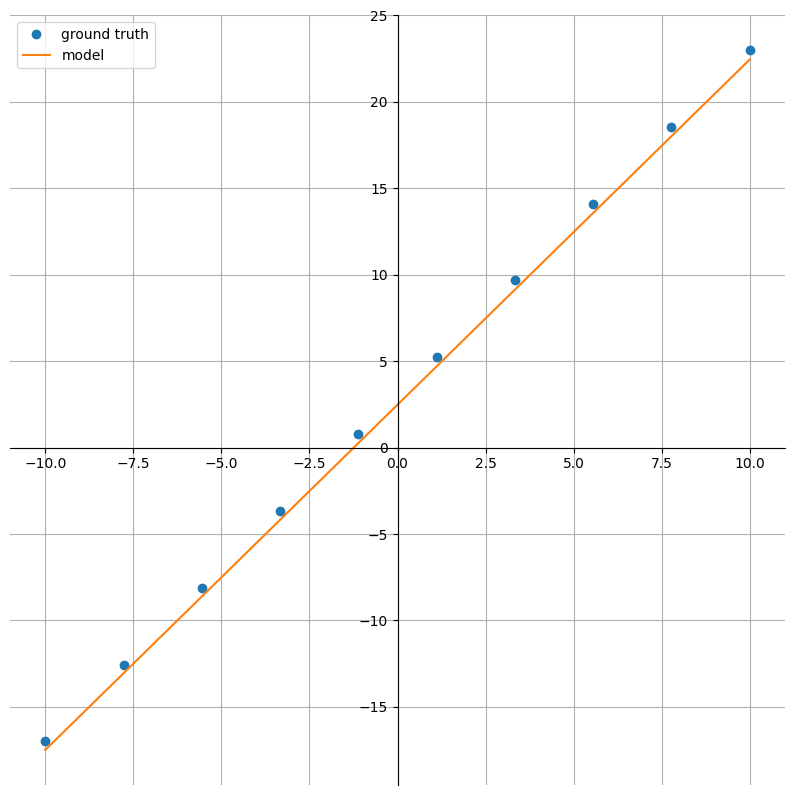

Epoch: 925; Train Loss: 0.24718298017978668


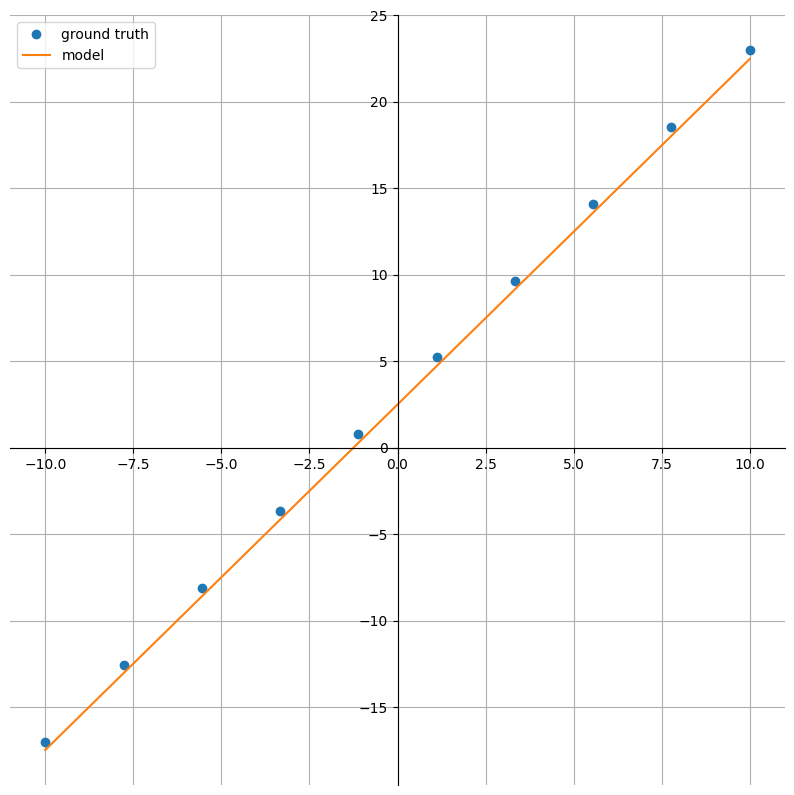

Epoch: 950; Train Loss: 0.22365251183509827


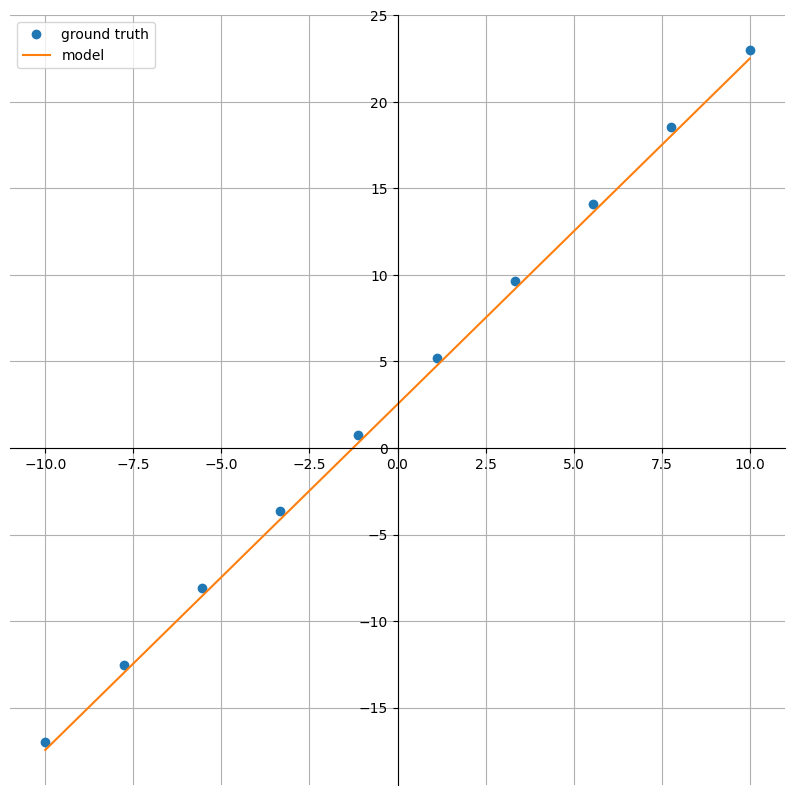

Epoch: 975; Train Loss: 0.202362522482872


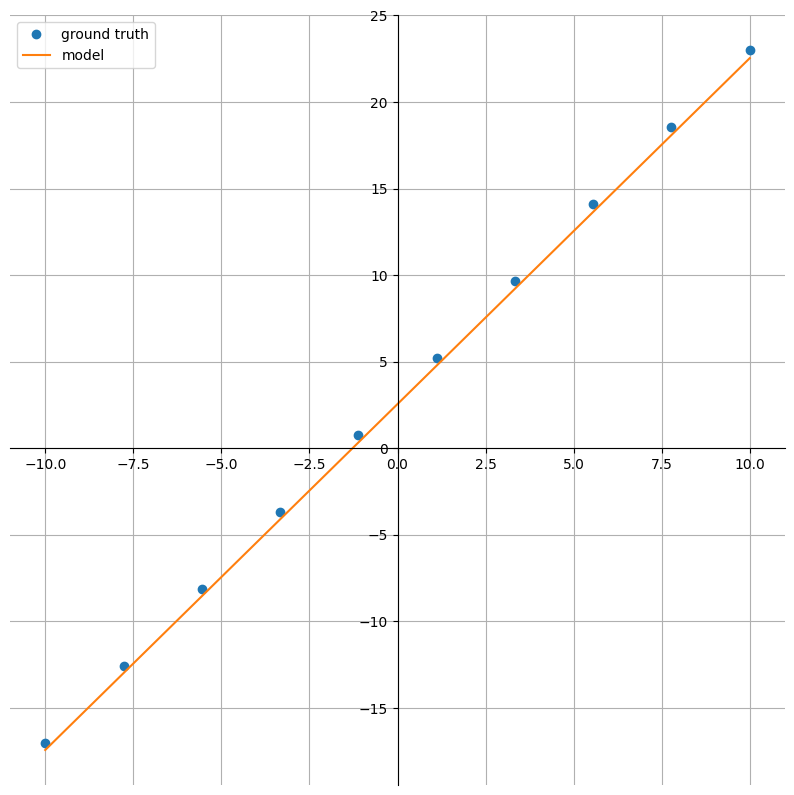

Epoch: 1000; Train Loss: 0.18309926986694336


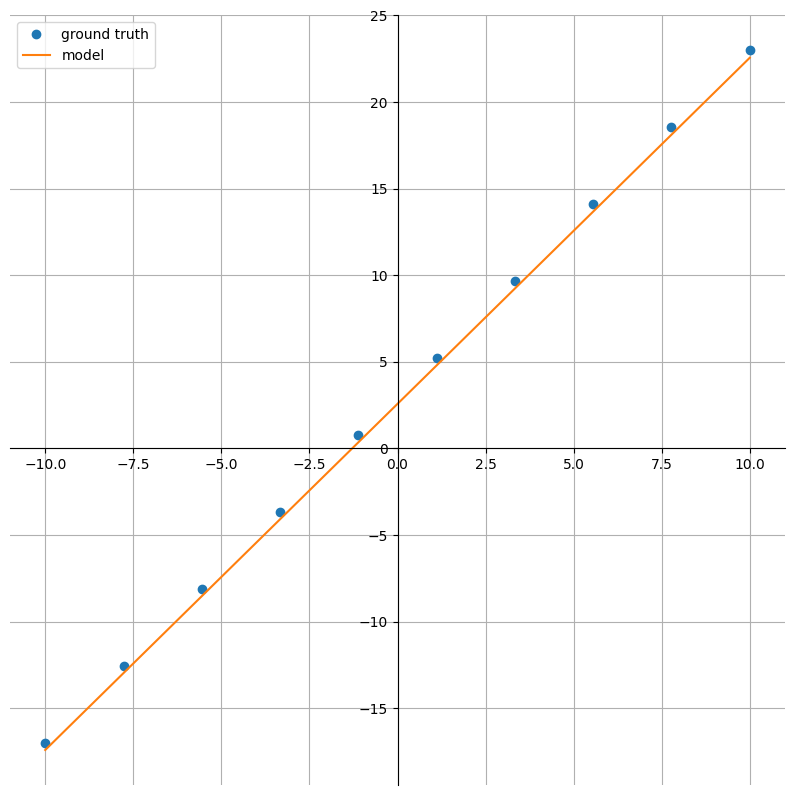

Test Loss: 0.18207670748233795


In [ ]:
epochs = 1001

# Let''s make a Gif of the training
filename_output = "./line_approximation.gif"
writer = imageio.get_writer(filename_output, mode='I', duration=0.3)

for t in range(epochs):
  train_loss = train(model, train_dataloader, lossfunc, optimizer)
  if t % 25 == 0:
    print(f"Epoch: {t}; Train Loss: {train_loss}")
    image = plot_comparison(line, model)
    # appending to gif
    writer.append_data(image)

test_loss = test(model, test_dataloader, lossfunc)
print(f"Test Loss: {test_loss}")
writer.close()

# 4. Now, it's your turn!

You will find below the definition of a new model, a fully connected network with 5 layers and the Rectified Linear Unit function as activation function. You should use the infrastructure defined in the example to train this model to approximate a more sophisticated function (for example, a parabola).

- You are free to experiment with the network architecture: increase or decrease the number of layers; change the number of neurons in specific layers etc.
- You are free to choose the function you'll use to build your dataset. The simplest way to make it work is to build a new instance of AlgebraicDataset passing a new lambda function and a new (or same) domain. However, feel free to experiment more complex ways of defining a function.
- You are free to modify the visualization routine if you want to improve it.
- Experiment different hyperparameters such as number of training epochs, learning rate, or loss function.


In [62]:
class MultiLayerNetwork(nn.Module):
  def __init__(self):
    super().__init__()
    self.layers = nn.Sequential(
        nn.Linear(1, 128),
        nn.Sigmoid(),
        nn.Linear(128, 64),
        nn.Sigmoid(),
        nn.Linear(64, 32),
        nn.Sigmoid(),
        nn.Linear(32, 8),
        nn.Sigmoid(),
        nn.Linear(8, 1),
    )

  def forward(self, x):
    return self.layers(x)

In [ ]:
# Write your solution below this cell

#Solução

##1. Formulação matemática

A formulação utilizada na solução desse problema será descrita a seguir.

Considere a seguir uma função $Y$ não-linear e randômica, $X$ uma variável determinística e ϵ um ruído gaussiano.
\begin{align}
       Y = \cos(X) + ϵ, ϵ \sim \mathcal{N}(0,\sigma^2) \tag{1}
\end{align}

Dado um conjunto de observações de $(x_i, y_i)_{1,...,N}$ tem-se que a distribuição probabilidade de $Y$ é (considerando que ϵ é independente para cada observação)
\begin{align}
       P(Y|X) = \prod_{i\in N} p(y_i|x_i) = \prod_{i\in N} \frac{1}{\sigma\sqrt{2\pi}} e^{-\frac{(y_i-cos(x_i))^2}{2\sigma^2}} \tag{2}
\end{align}
Agora, considere uma rede MLP cuja entrada é um vetor $X \in \mathbb{R}^{n}$ e a variável de saída é $\hat{Y} = f_{\theta}(X)$, onde $f_{\theta}$ é um modelo proposto na MLP e $\theta = (\mathbf{w},\mathbf{b})$ são parâmetros da rede. É razoável assumir que haverá um erro entre $\hat{Y}$ e $Y$, logo $Y = \hat{Y} + \delta(\theta)$ onde $\delta(\theta)$ é um erro que depende dos parâmetros da rede. O principal objetivo deste trabalho é ajustar os parâmetros $\theta$ de forma que $\delta(\theta)$ seja tão pequeno quanto possível. Essa condição é análoga a encontrar os parâmetros $\theta$ de forma que $D_{KL}(P(Y|X) , P(\hat{Y}|X;\theta))$, a distância entre as duas probabilidades, seja a menor possível. Com isso,
\begin{align}
      \theta^{*} = \operatorname*{argmin}_ {\theta} D_{KL}(P(Y|X) , P(\hat{Y}|X;\theta)) = \operatorname*{argmin}_ {\theta} \mathbb{E}[\log (P(\hat{Y}|X;\theta)))] \tag{3}
\end{align}
A última tarefa consiste em propor uma distribuição para $P(\hat{Y}|X;\theta)$. Como nosso conjunto de dados é oriundo de uma distribuição normal, a mesma pode ser proposta para a rede MLP, isto é,
\begin{align}
       \mathbb{L}(\theta) := P(\hat{Y}|X;\theta) = \prod_{i\in N} \frac{1}{\hat{\sigma}\sqrt{2\pi}} e^{-\frac{(y_i-f_\theta(x_i))^2}{2\hat{\sigma}^2}} \tag{4}
\end{align}
Note que $\hat{\sigma} \neq \sigma$ uma vez que o último não é conhecido. Substituindo esta última equação na anterior, tem-se finalmente
\begin{align}
\theta^{*} = \operatorname*{argmin}_ {\theta} \frac{1}{n}\sum_{i\in N} (y_i - f_{\theta}(x_i))^2 \tag{5}
\end{align}
que coincide com o erro quadrático médio (MSE) proveniente do princípio da máxima verossimilhança (MLE). É importante notar que o método descrito fornece uma forma sistemática de se obter funções de custo para as redes MLP.

Por fim, um fato importante que deve ser considerado é que a definição da função $\mathbb{L}(\theta)$ tem um caráter extrínsico, uma vez que deve ser acessado dados externo ($y_{i}$) à varidade estatística definida por $\mathbb{S} = \{P(\hat{Y}|X;\theta), \theta \in 𝚯 \}$. É possível definir uma outra função $L(\theta)$ que depende apenas de dados íntrisecos à variedade utilizando a métrica de Fisher e com isso definimos o gradiente descendente natural que ,em geral, performa melhor que o método do gradiente descendente estocástico, porém com um maior custo computacional. Essa situação é ilustrada na Figura 1 (Calin, 2020). A principal vantagem dessa abordagem é importar para um problema estatístico a intuição geométrica proveniente da variedade.

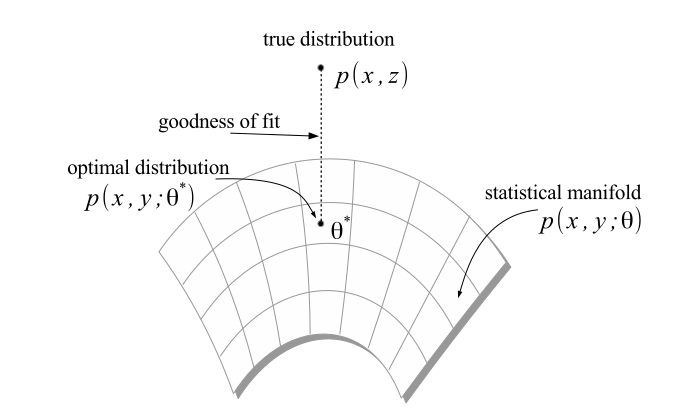










##2. Considerações sobre a implementação computacional

No arquivo `my_mlp.py` foi fornecido uma implementação do algoritmo de diferenciação automática que performa de forma análoga ao pytorch. Para a construção do grafo computacional foi utilizado a classe base `Node` responsável por armazenar atributos fundamentais para a construção do grafo, o valor parcial da função no nó e o valor da gradiente em relação à variável presente no nó. Além disso, com o método `add_edge()` é possivel adicionar qualquer nó à rede mesmo após a sua criação.

As operações de traversia no grafo necessárias para avaliar o modelo no útlitmo nó e executar o algoritmo de backprogation foram feitas por meio da DFS. Na etapa de preparação da rede é feita uma ordenação topológica reversa, isso ocorre para garantir que dura a retropropação dos gradientes todas derivadas à frente do nó já estejam calculadas. O programa fornecido permite visualizar qualquer MLP em sua ordem topológica (ver imagem a seguir). 

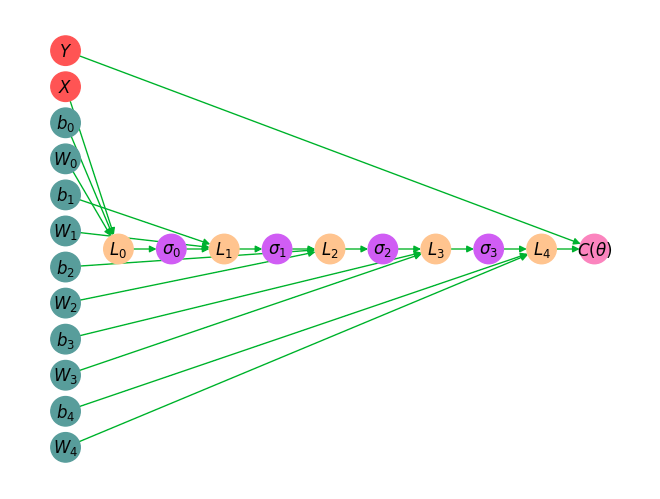

A principal referência usada para implementação do algoritmo de diferenciação atuomática foi https://thenumb.at/Autodiff/. 

### 2.1 Implementação com módulo neural network (nn) do pytorch
A seguir será feita a mesma implementação da rede fornecida em `my_mlp.py`, porém, agora, com o módulo `torch.nn`. Nota-se a semelhança dos resultados.

Epoch: 0; Train Loss: 0.6681749820709229


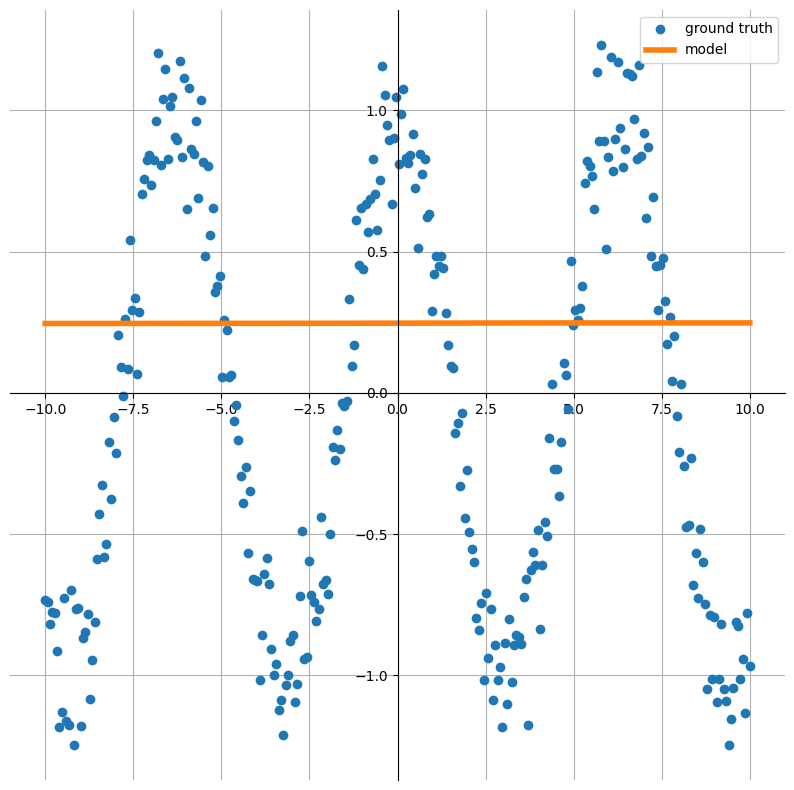

Epoch: 25; Train Loss: 0.5441864132881165


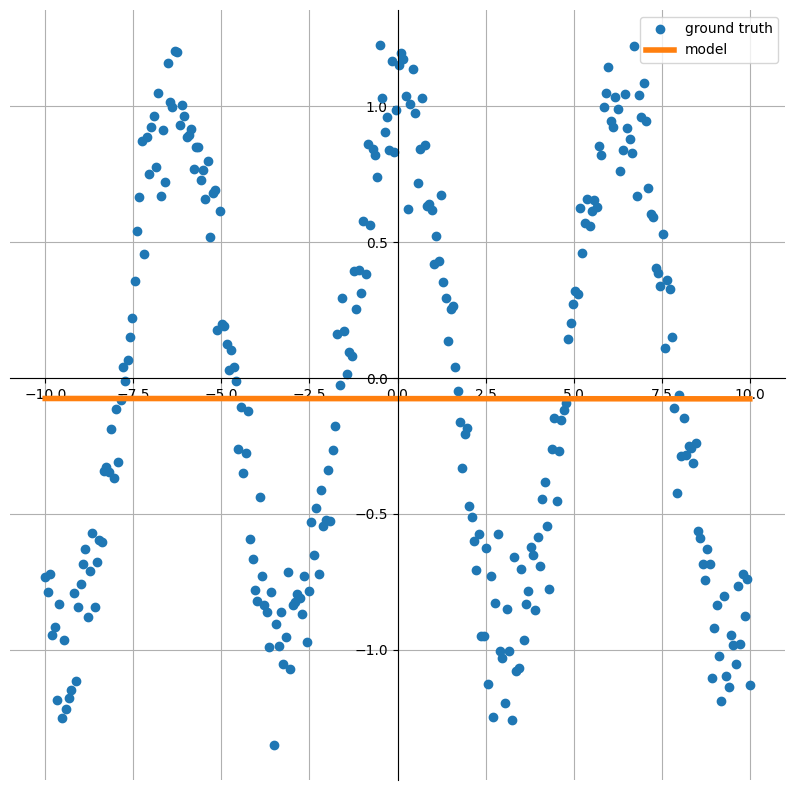

Epoch: 50; Train Loss: 0.5441460609436035


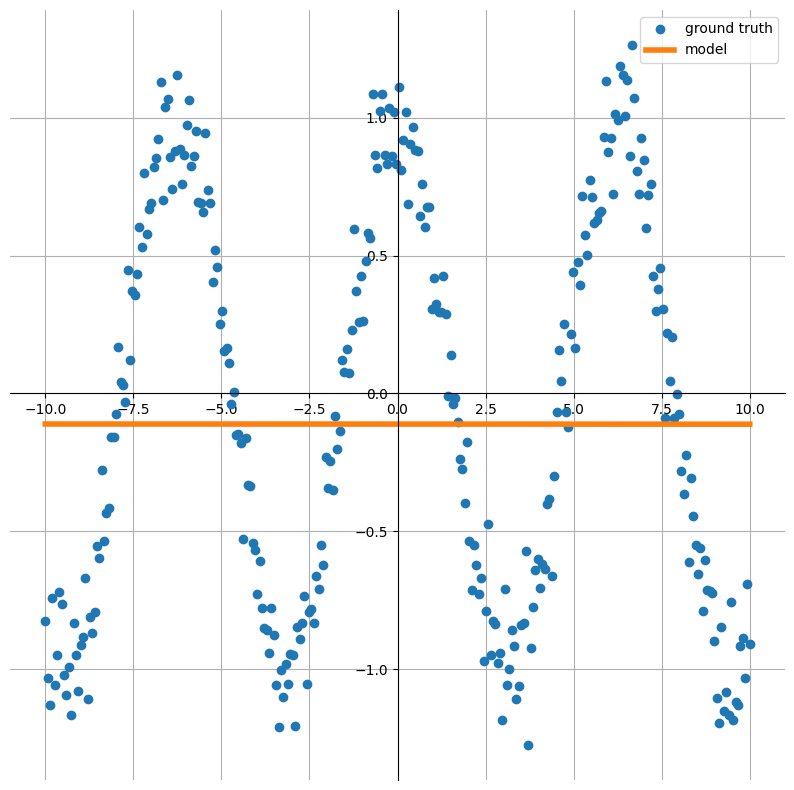

Epoch: 75; Train Loss: 0.5436054468154907


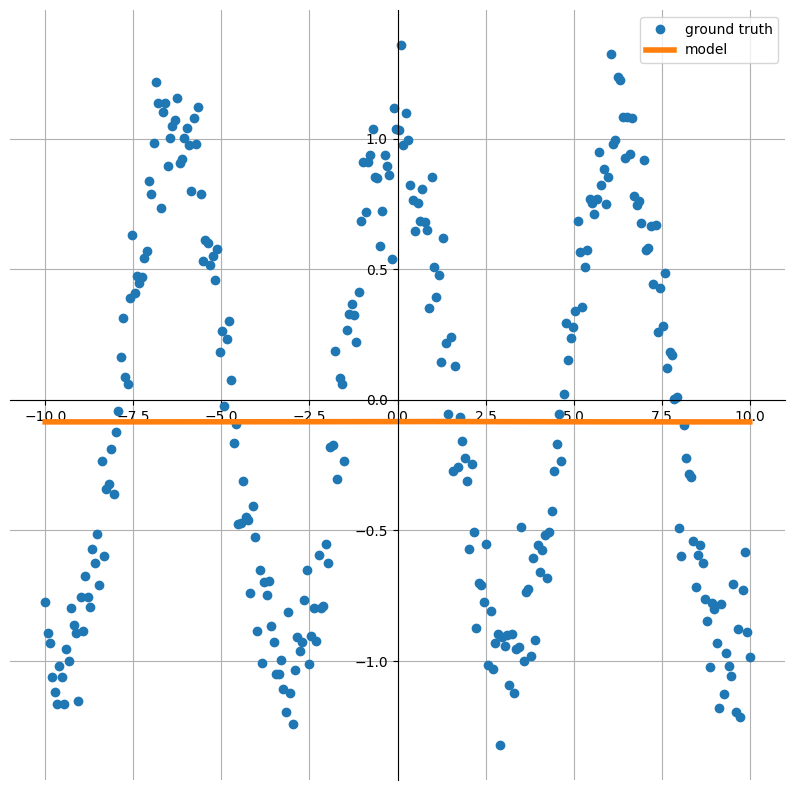

Epoch: 100; Train Loss: 0.5434711575508118


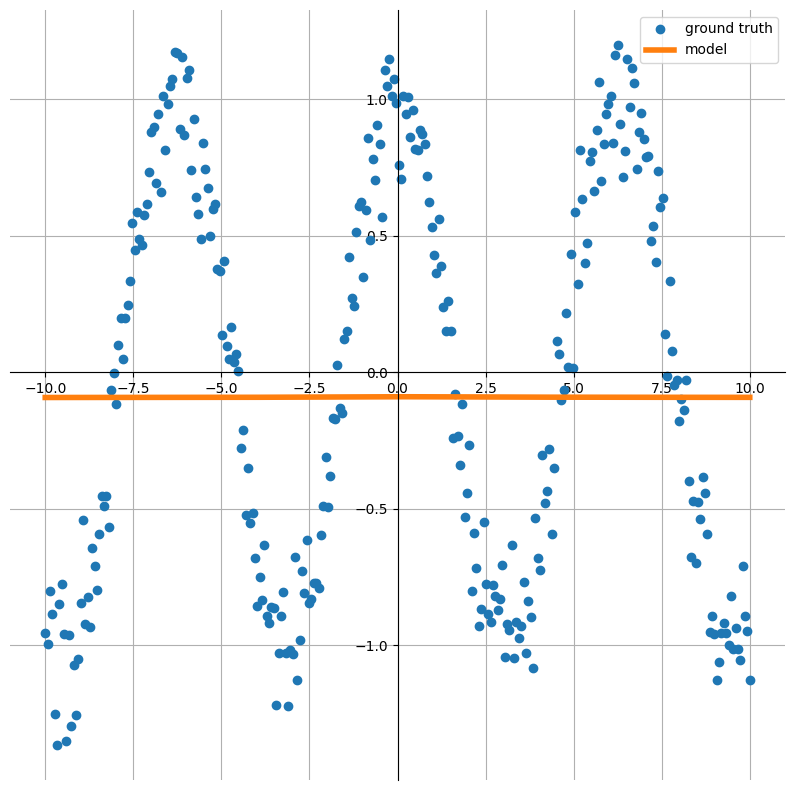

Epoch: 125; Train Loss: 0.5433351397514343


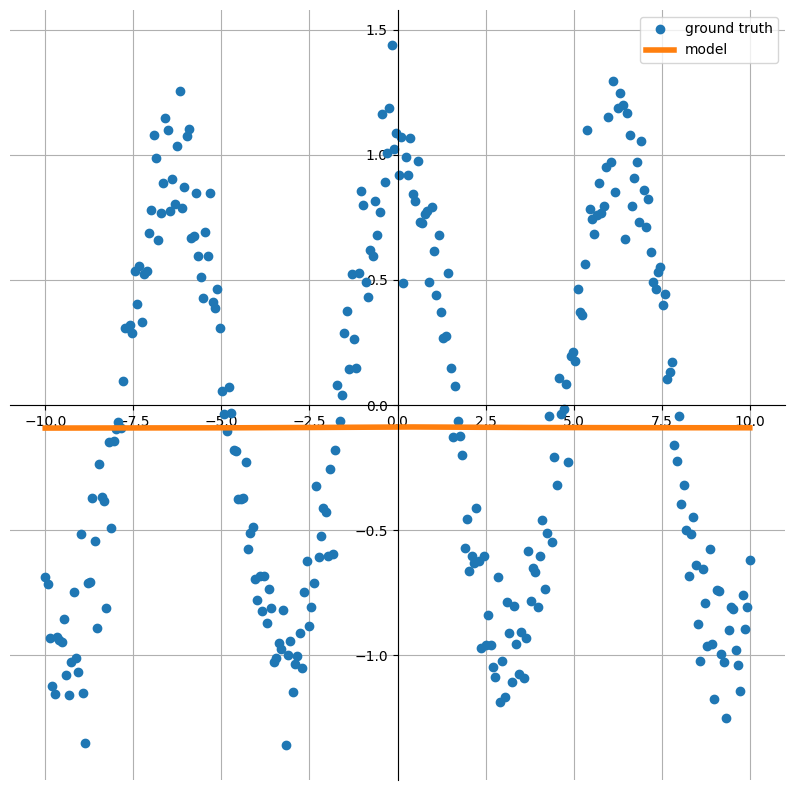

Epoch: 150; Train Loss: 0.5431249737739563


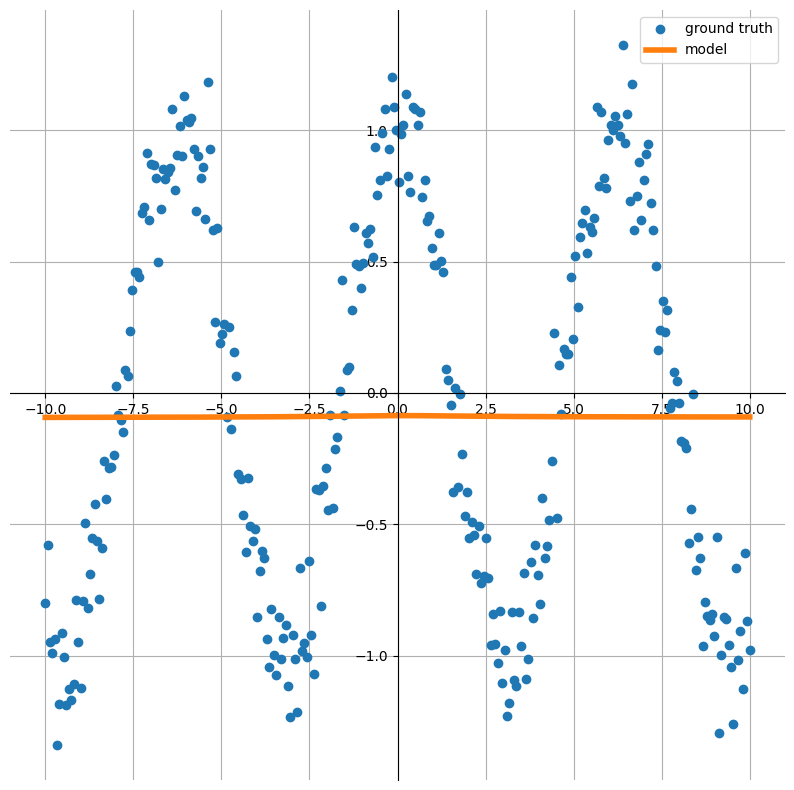

Epoch: 175; Train Loss: 0.5427621603012085


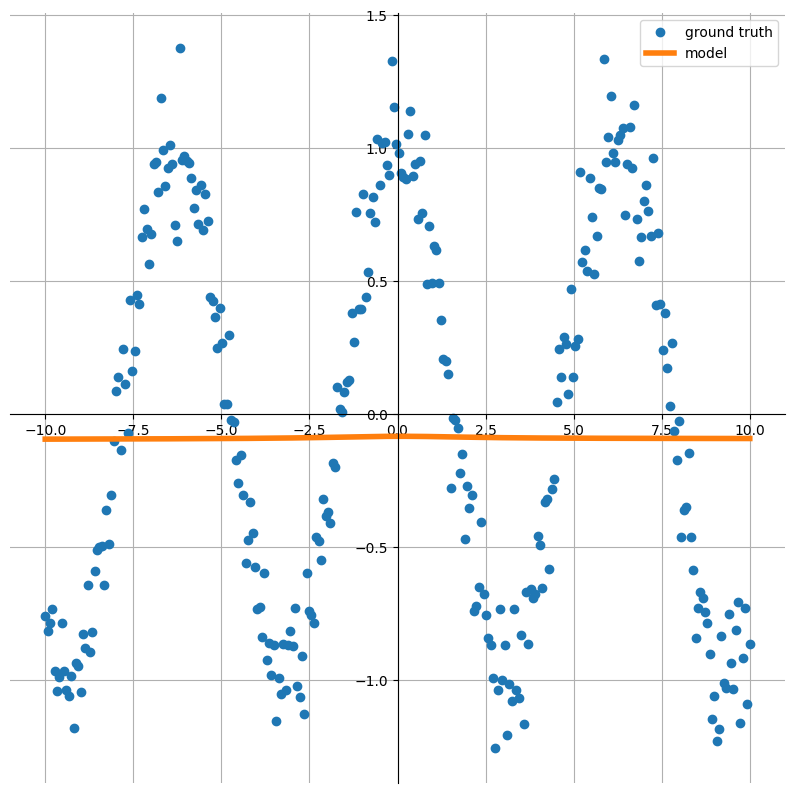

Epoch: 200; Train Loss: 0.5420865416526794


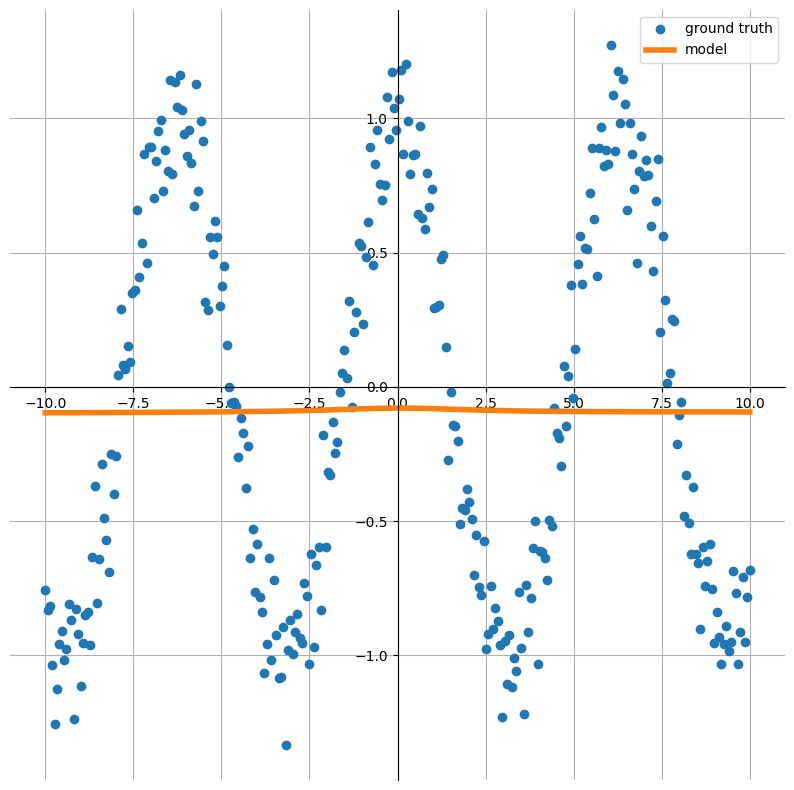

Epoch: 225; Train Loss: 0.5407728552818298


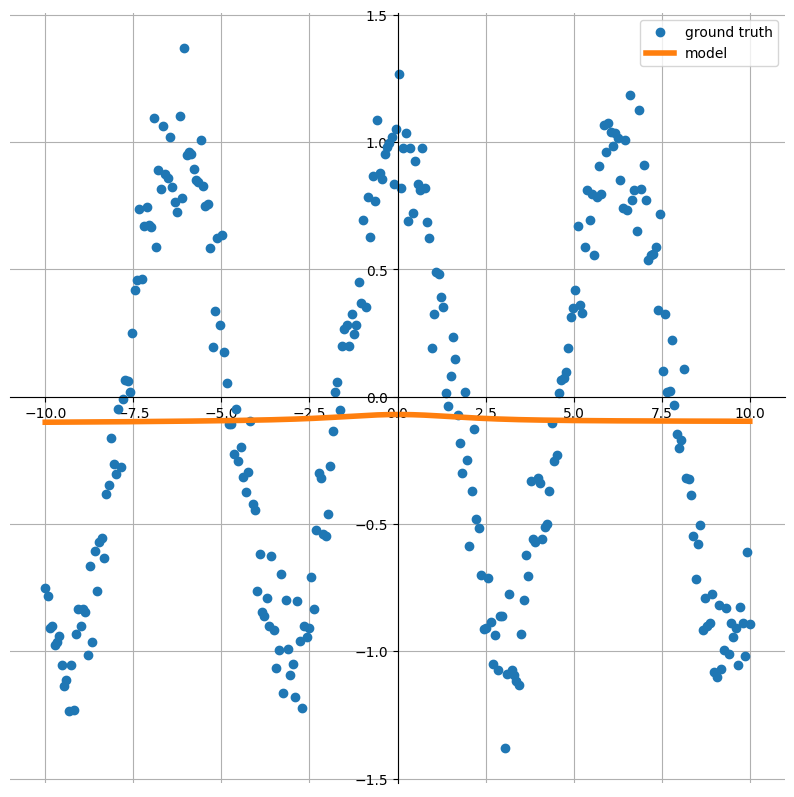

Epoch: 250; Train Loss: 0.5381895303726196


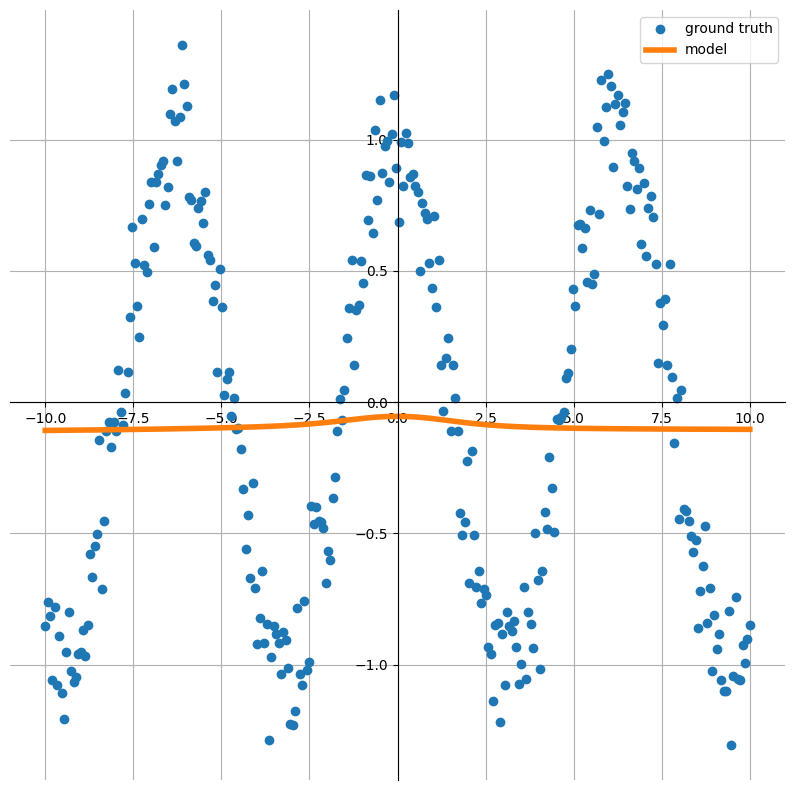

Epoch: 275; Train Loss: 0.5331822037696838


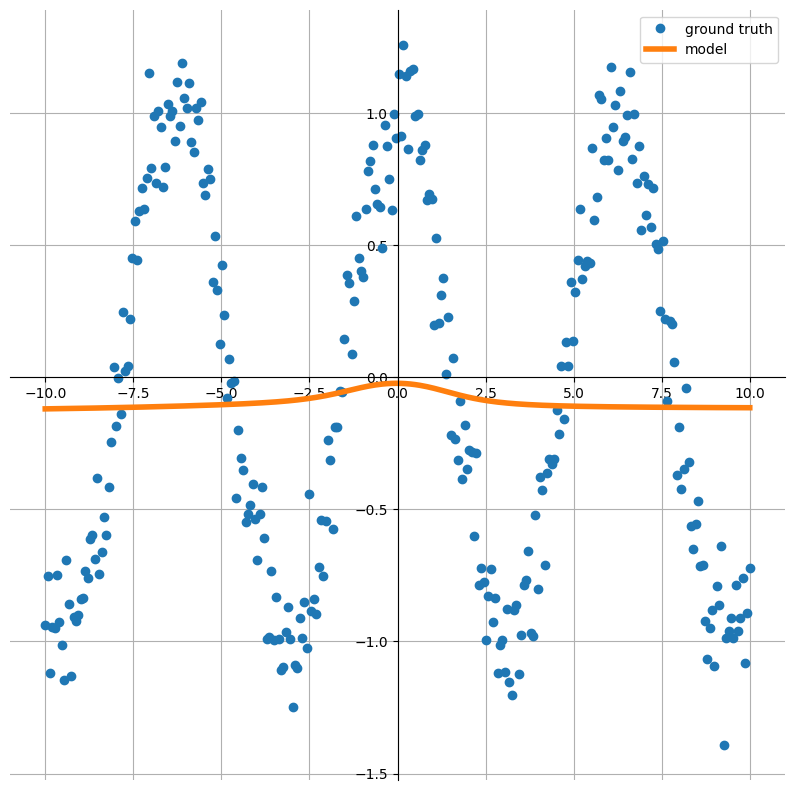

Epoch: 300; Train Loss: 0.5232090950012207


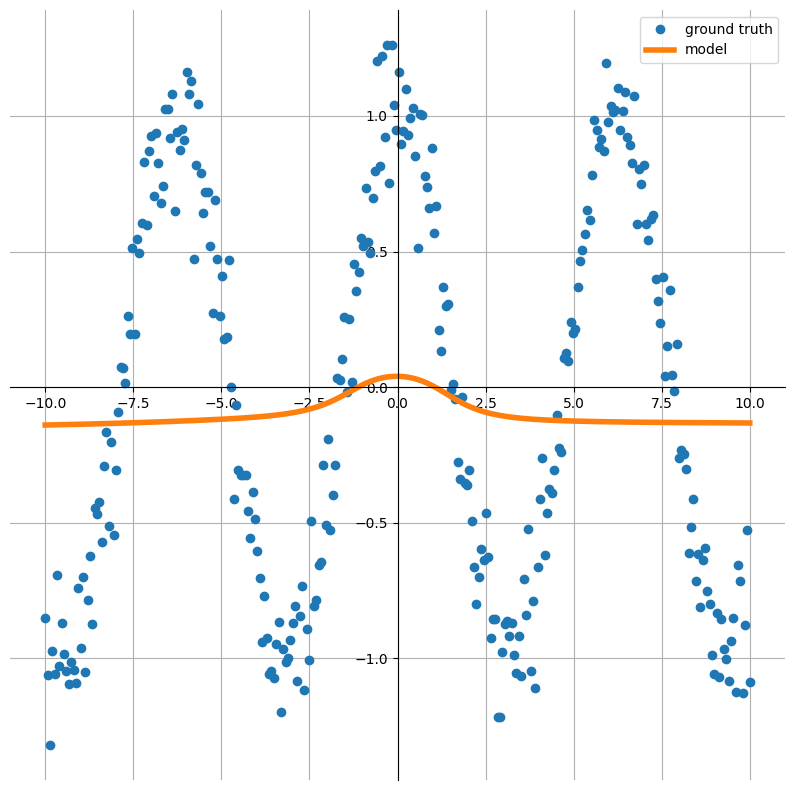

Epoch: 325; Train Loss: 0.5043573379516602


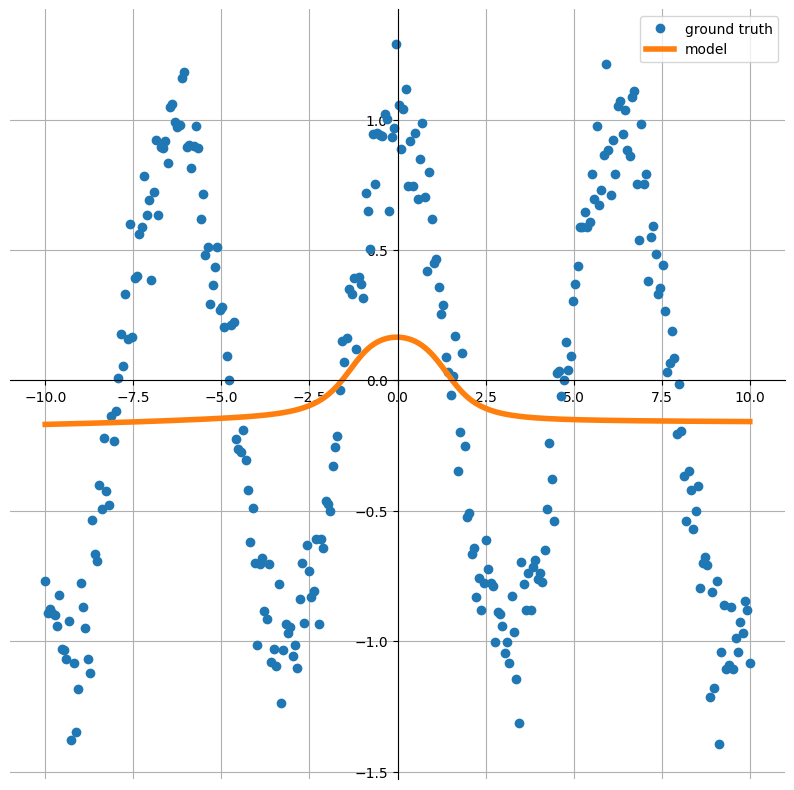

Epoch: 350; Train Loss: 0.4790302813053131


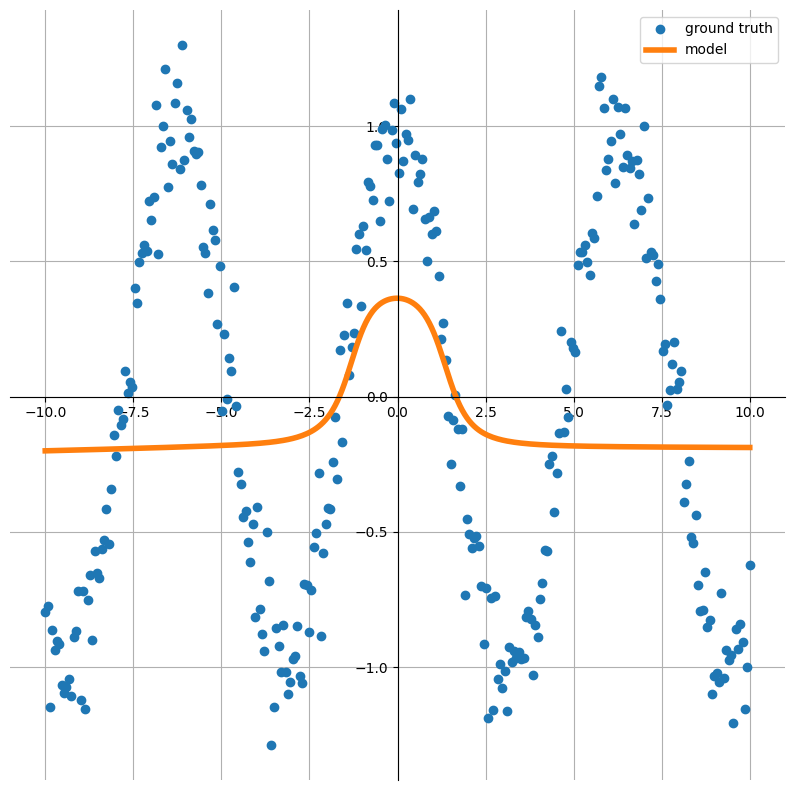

Epoch: 375; Train Loss: 0.45945876836776733


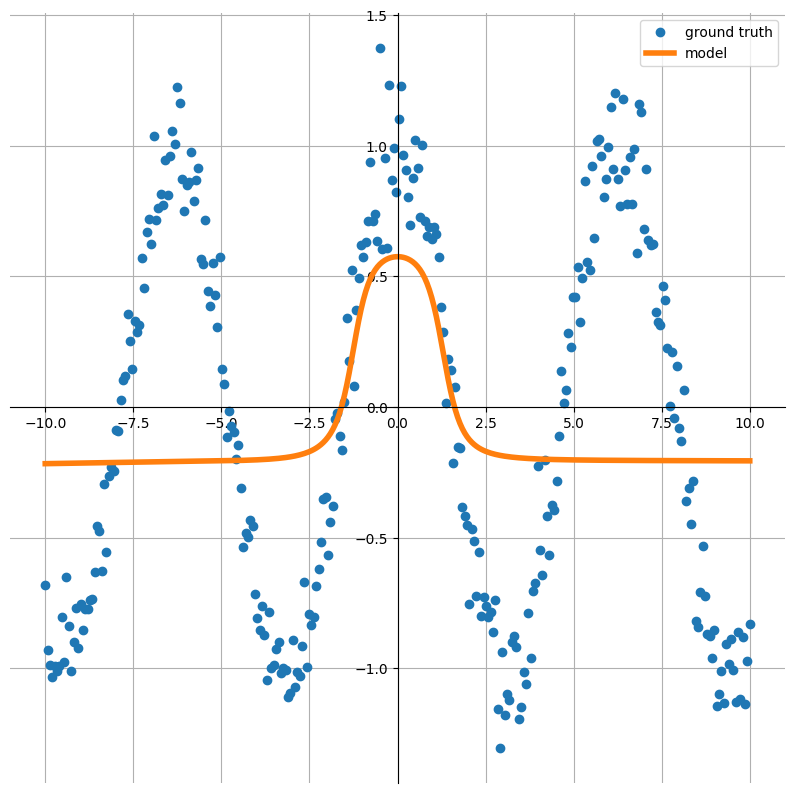

Epoch: 400; Train Loss: 0.45040568709373474


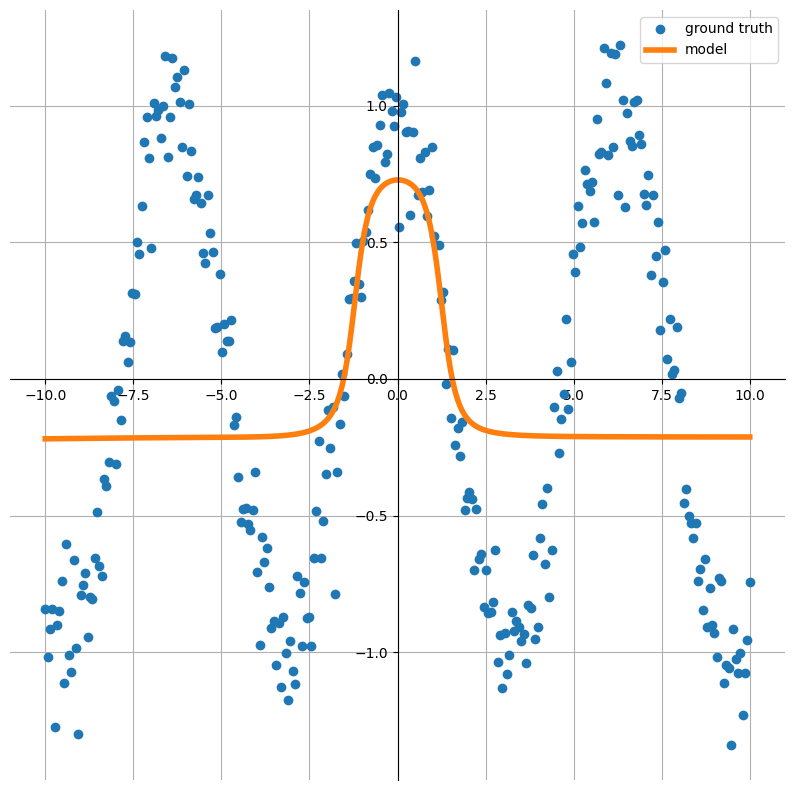

Epoch: 425; Train Loss: 0.44711315631866455


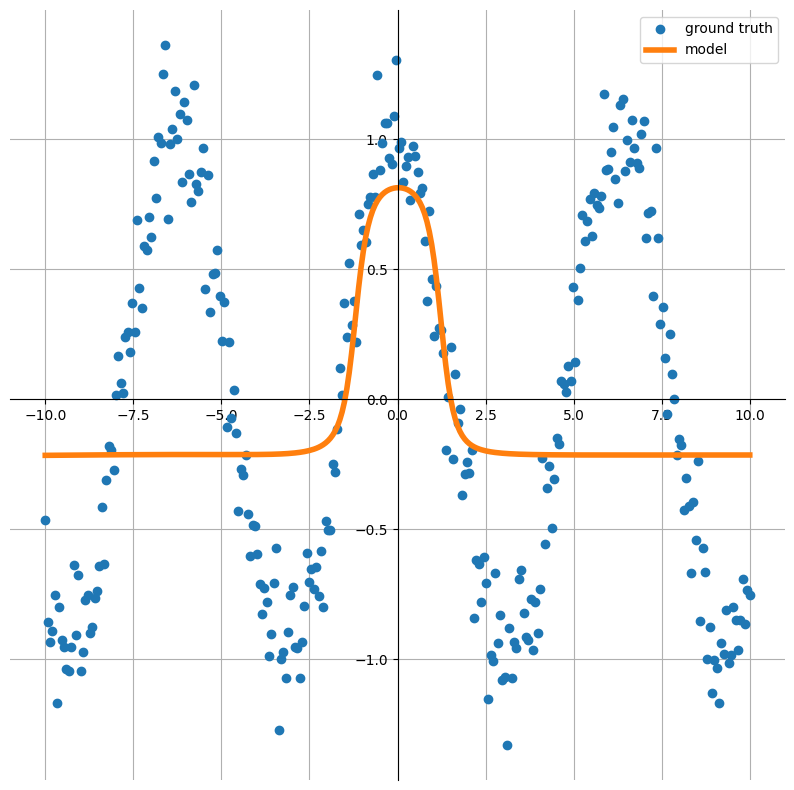

Epoch: 450; Train Loss: 0.44559744000434875


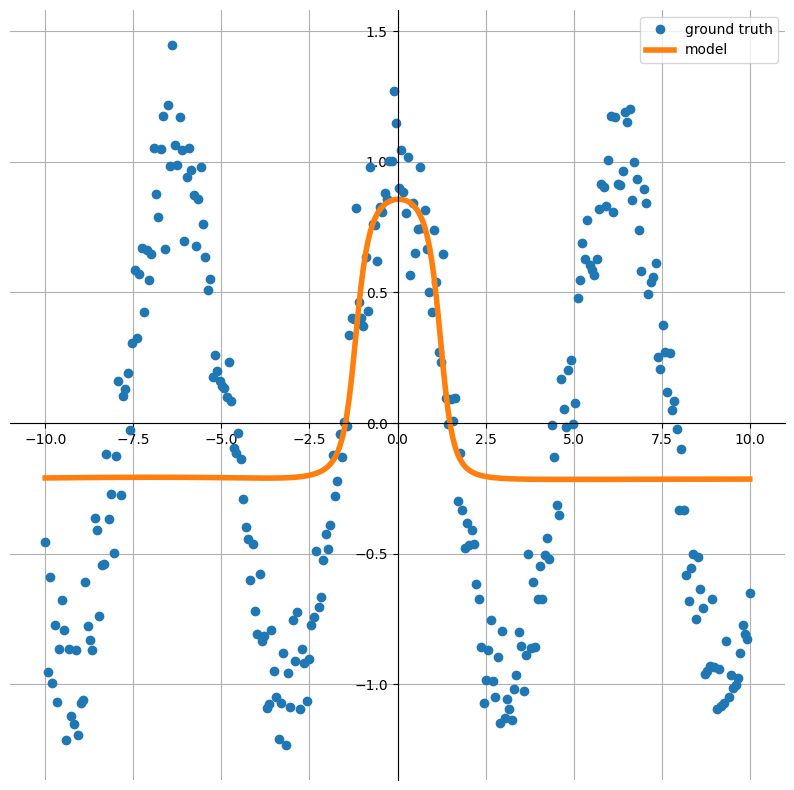

Epoch: 475; Train Loss: 0.4439634680747986


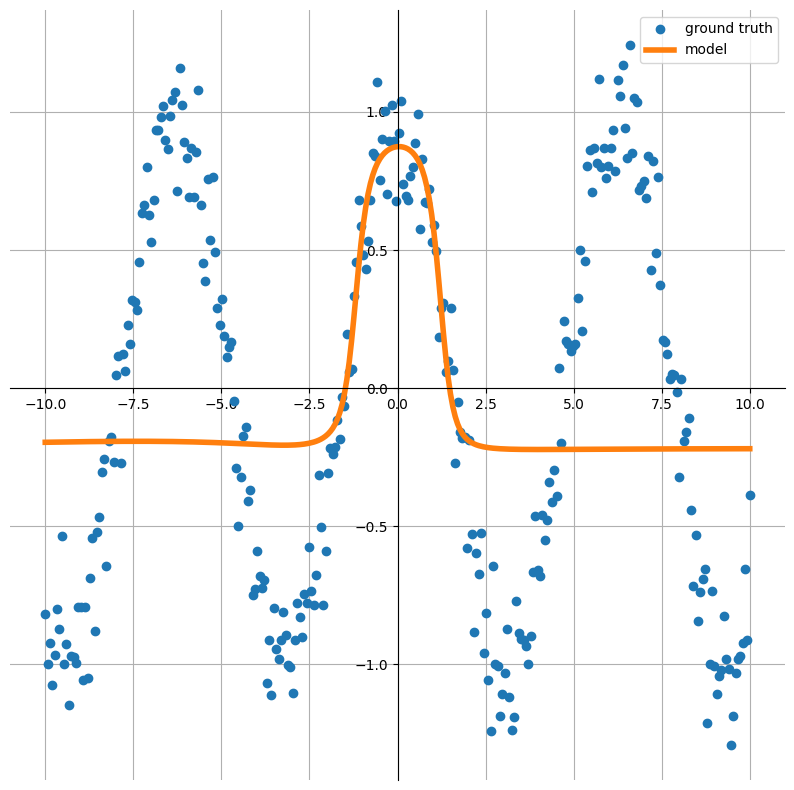

Epoch: 500; Train Loss: 0.4401901662349701


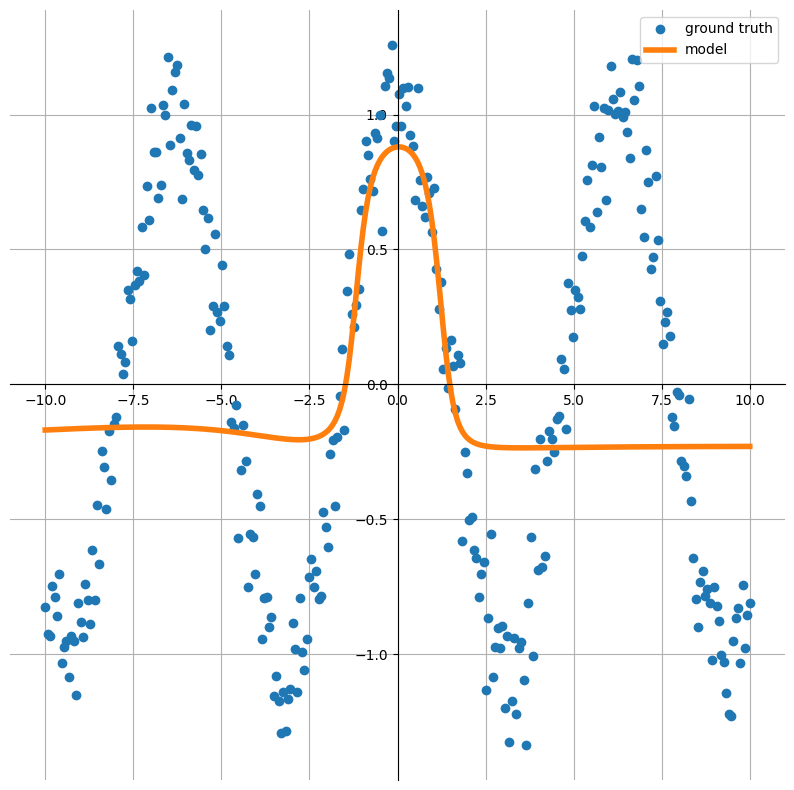

Epoch: 525; Train Loss: 0.4282574951648712


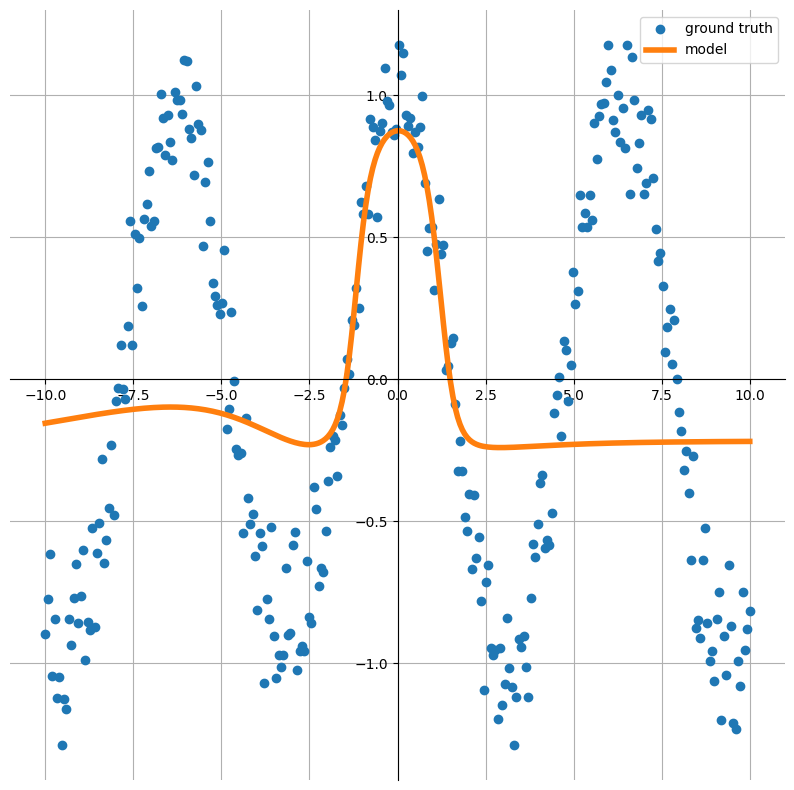

Epoch: 550; Train Loss: 0.3912433087825775


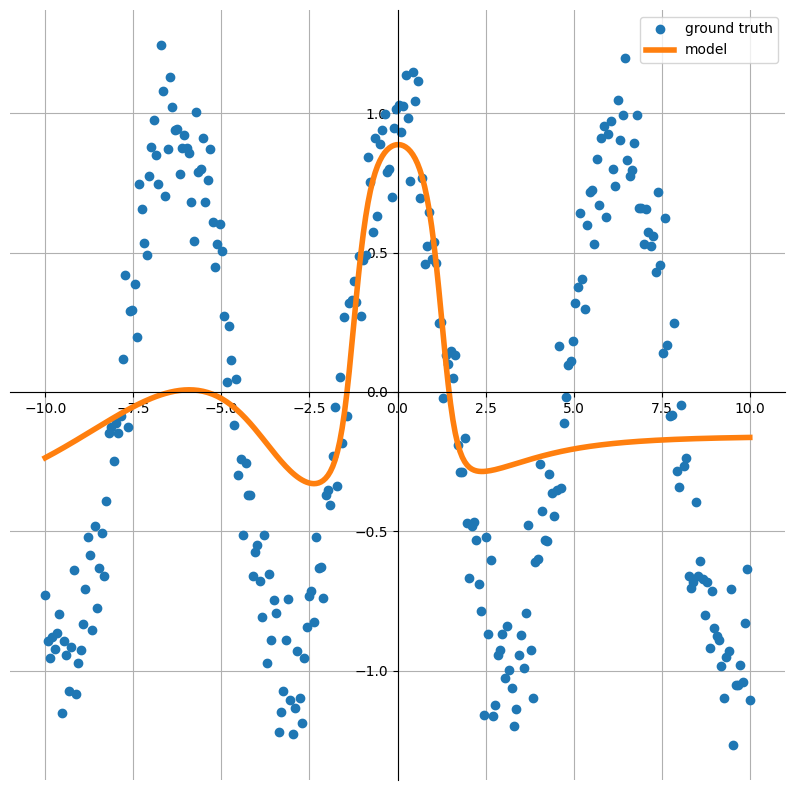

Epoch: 575; Train Loss: 0.31219130754470825


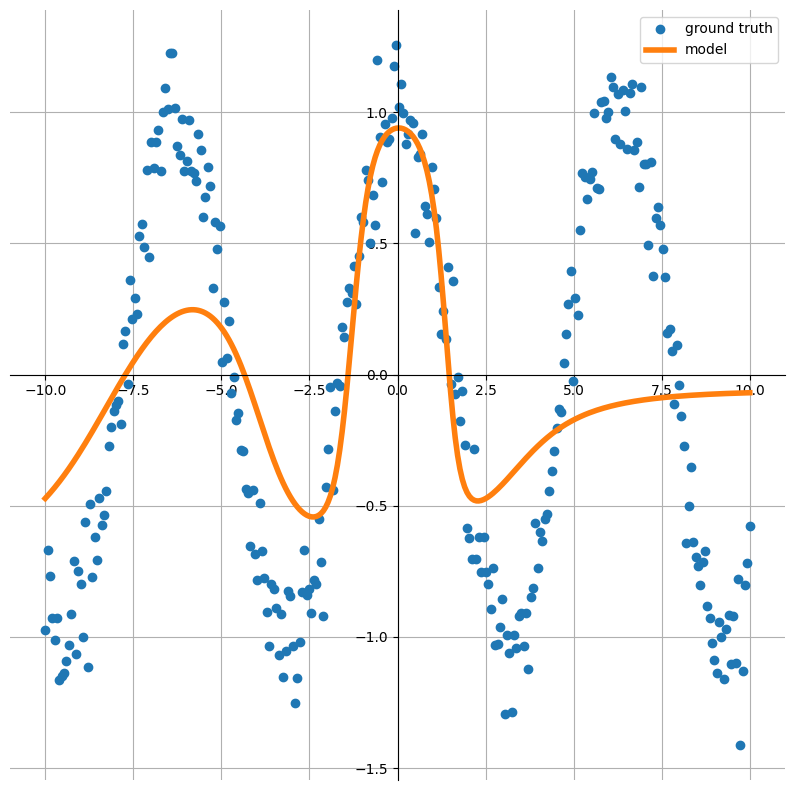

Epoch: 600; Train Loss: 0.24173186719417572


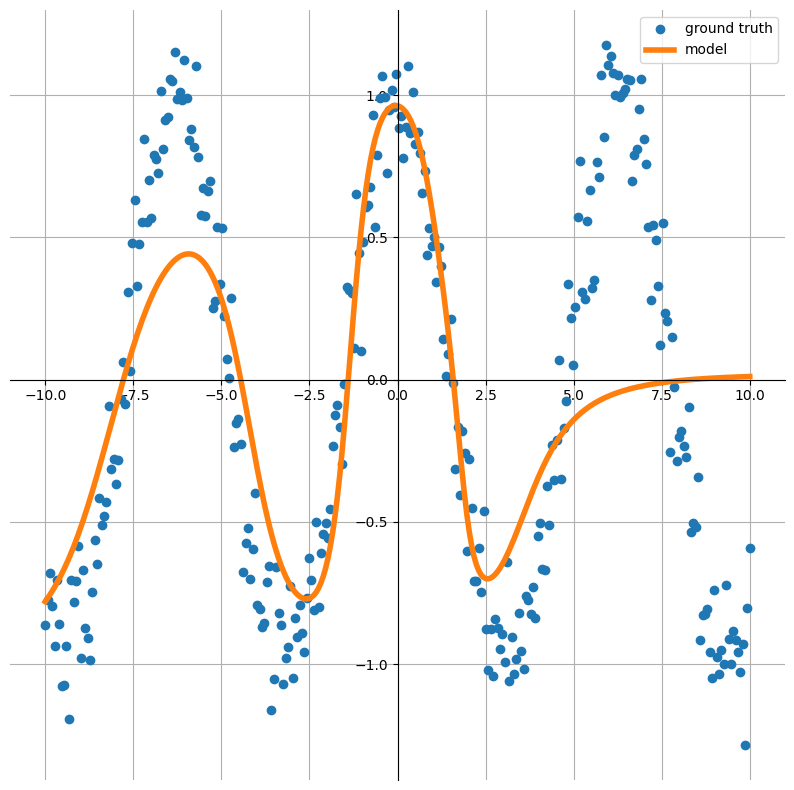

Epoch: 625; Train Loss: 0.20511846244335175


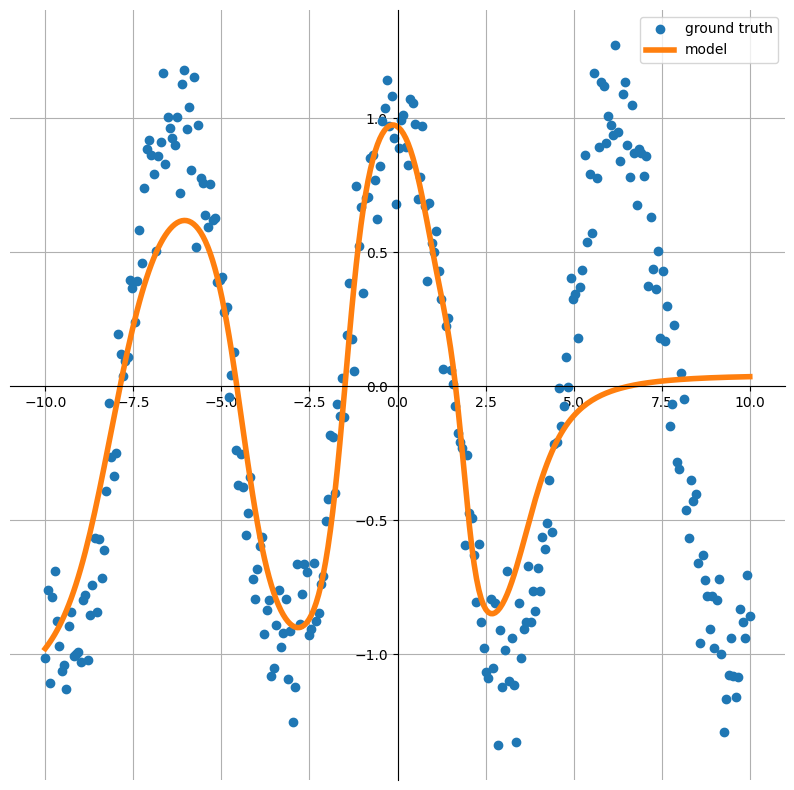

Epoch: 650; Train Loss: 0.18966679275035858


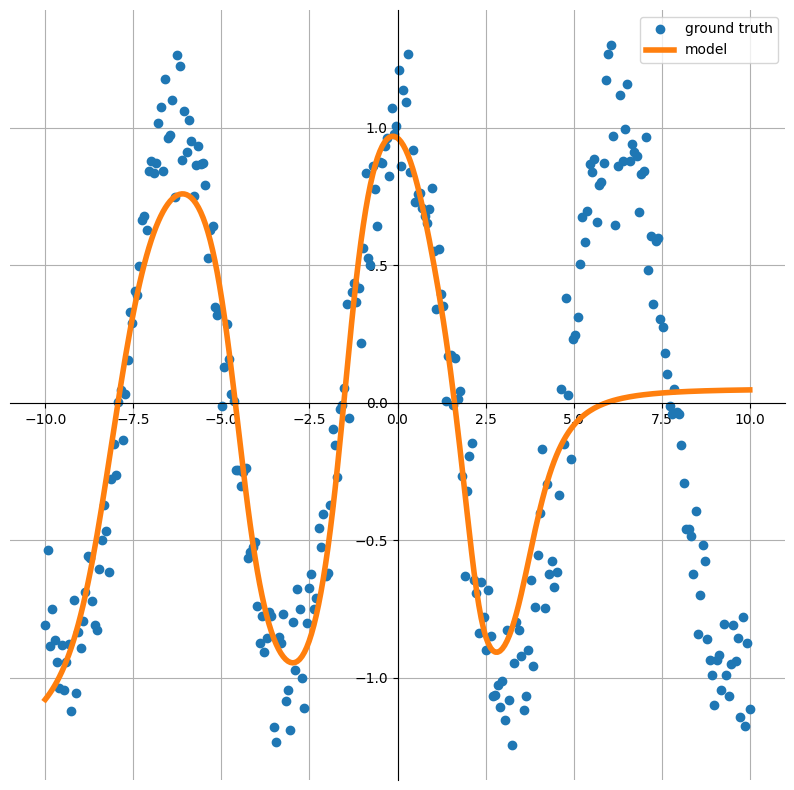

Epoch: 675; Train Loss: 0.1828182339668274


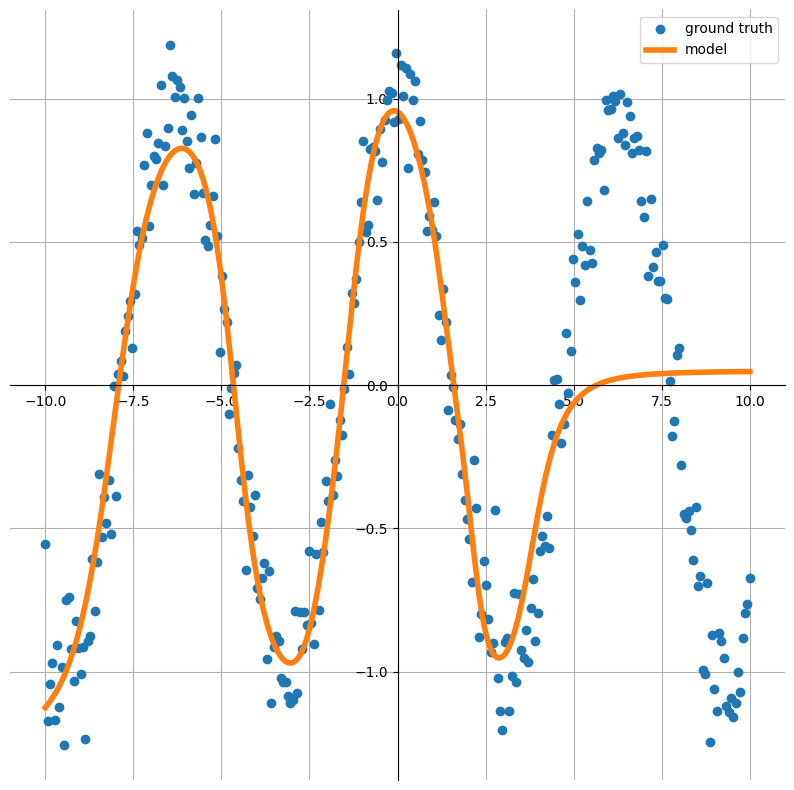

Epoch: 700; Train Loss: 0.179424449801445


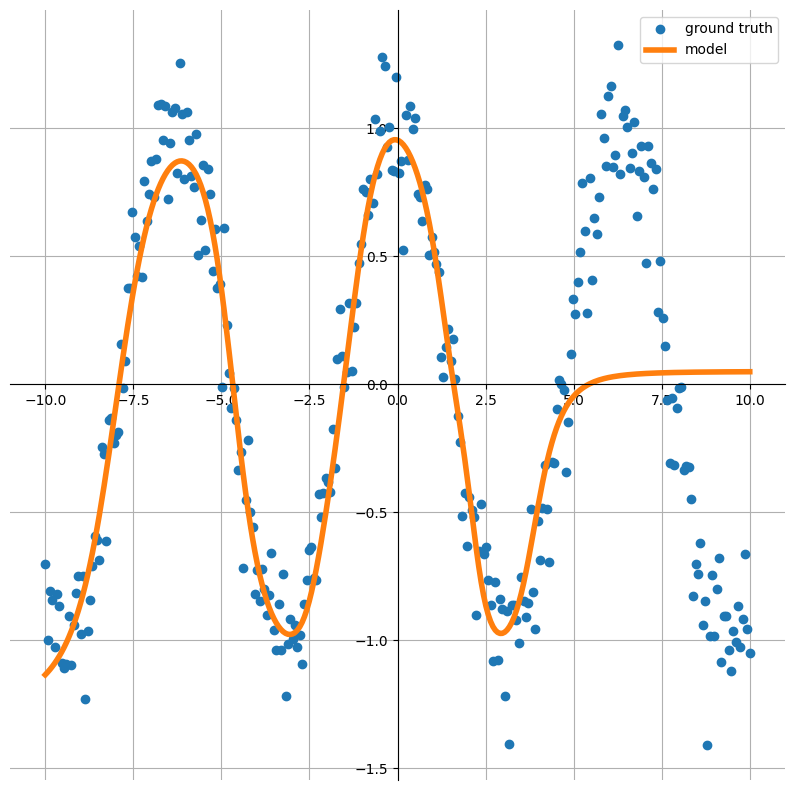

Epoch: 725; Train Loss: 0.17675434052944183


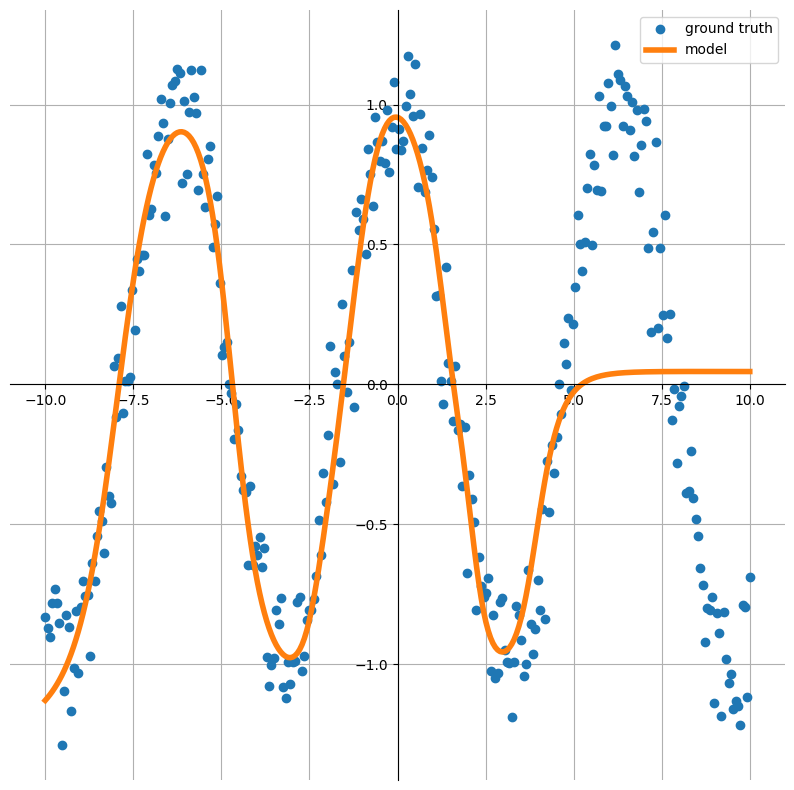

Epoch: 750; Train Loss: 0.15542511641979218


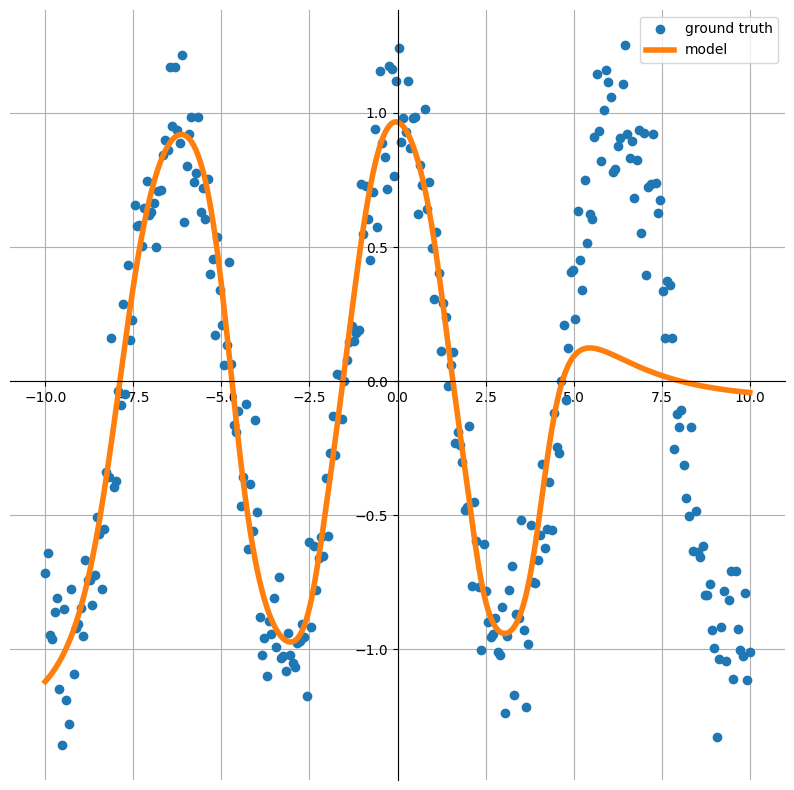

Epoch: 775; Train Loss: 0.09792116284370422


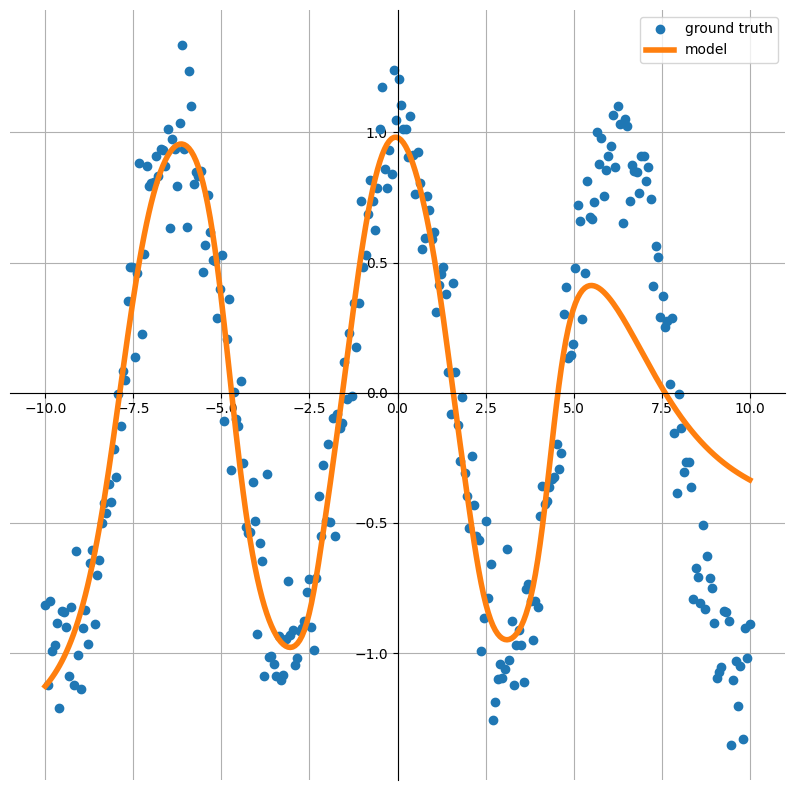

Epoch: 800; Train Loss: 0.050971534103155136


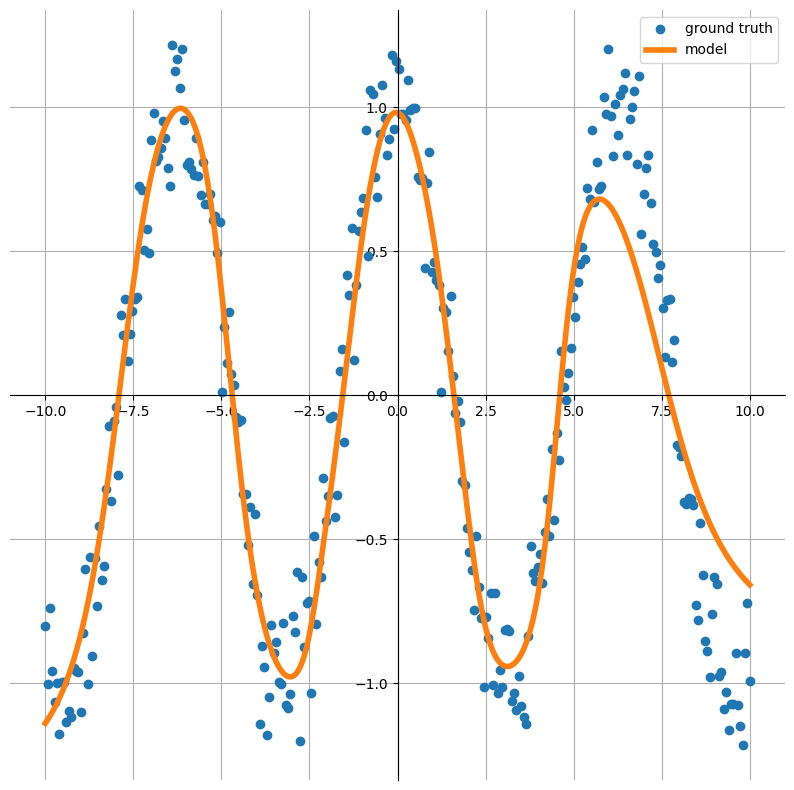

Epoch: 825; Train Loss: 0.030516160652041435


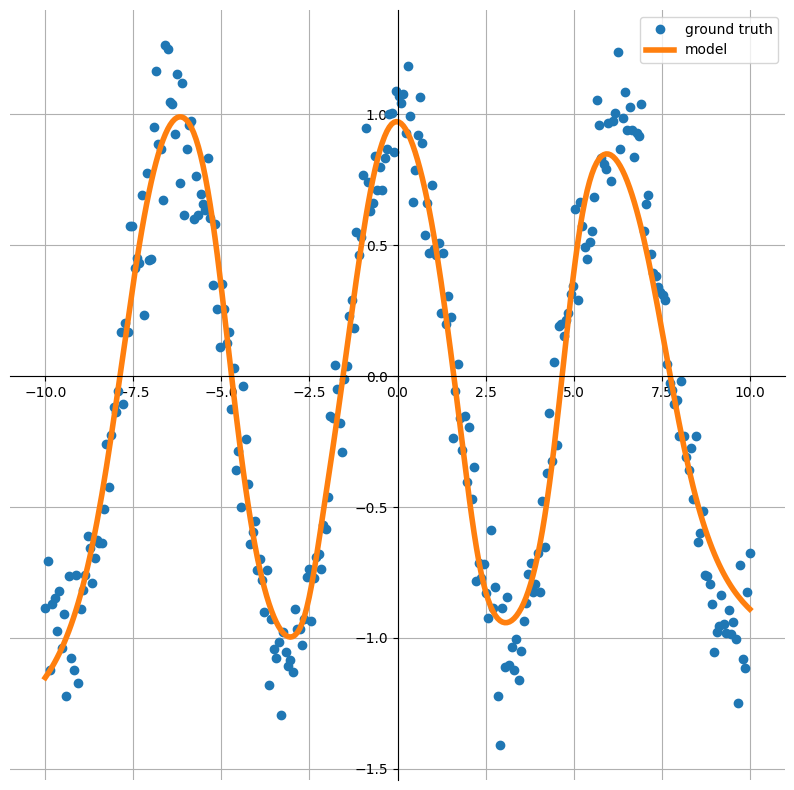

Epoch: 850; Train Loss: 0.025180324912071228


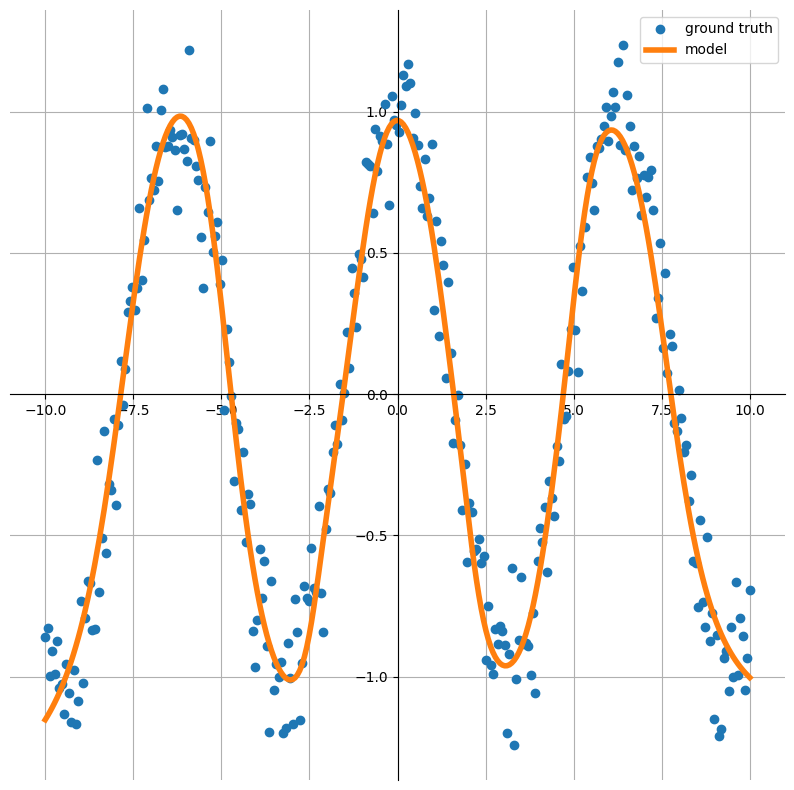

Epoch: 875; Train Loss: 0.024101819843053818


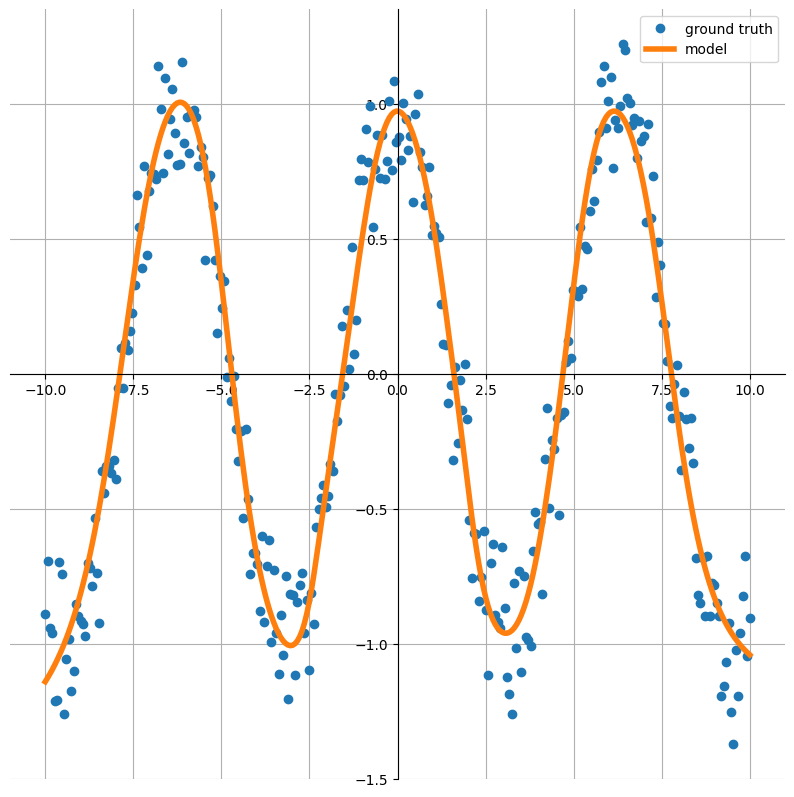

Epoch: 900; Train Loss: 0.023753298446536064


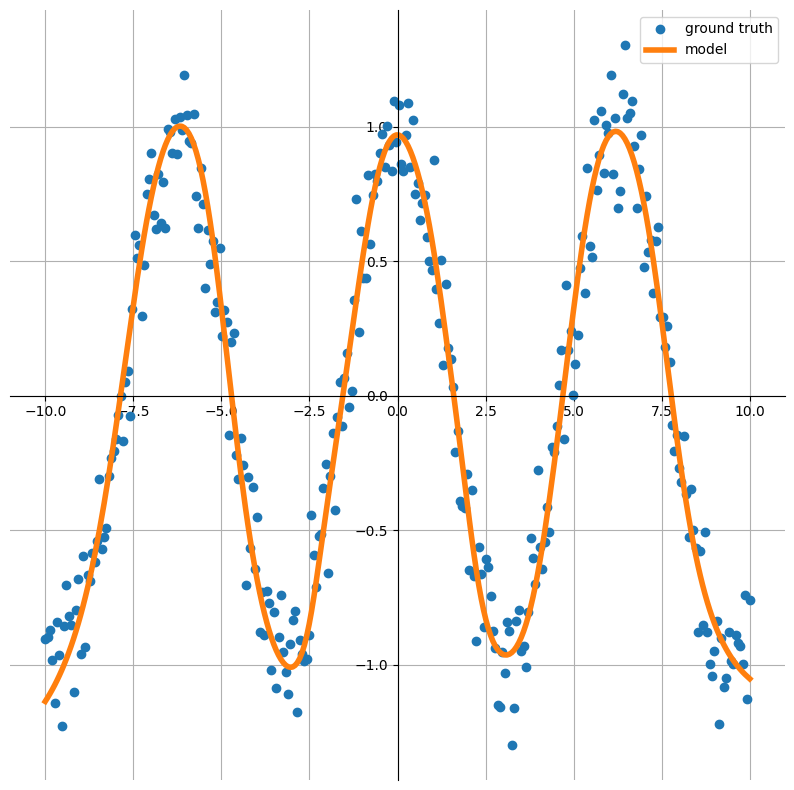

Epoch: 925; Train Loss: 0.023615162819623947


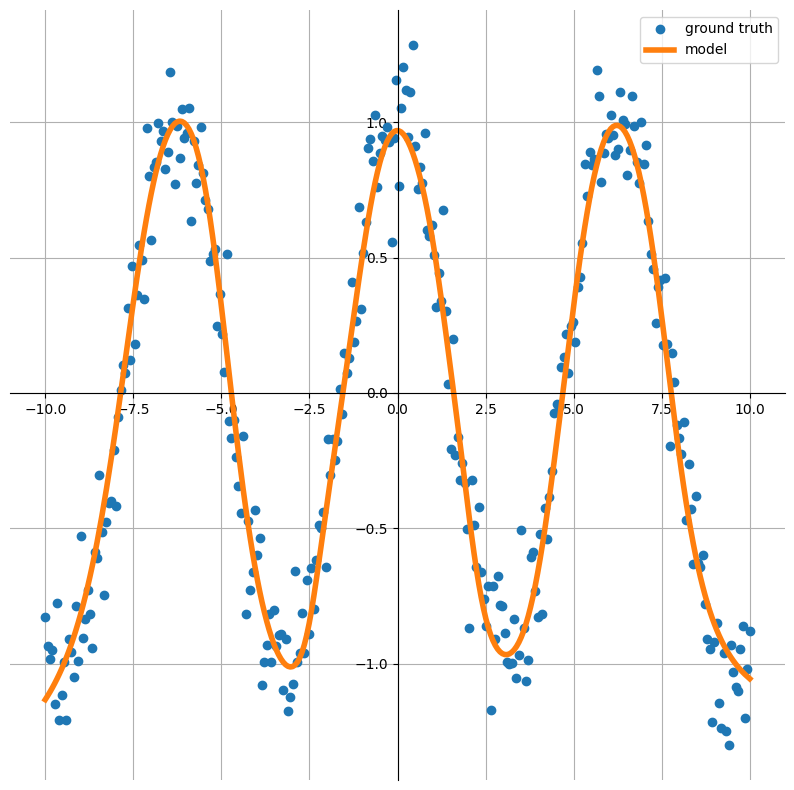

Epoch: 950; Train Loss: 0.023533232510089874


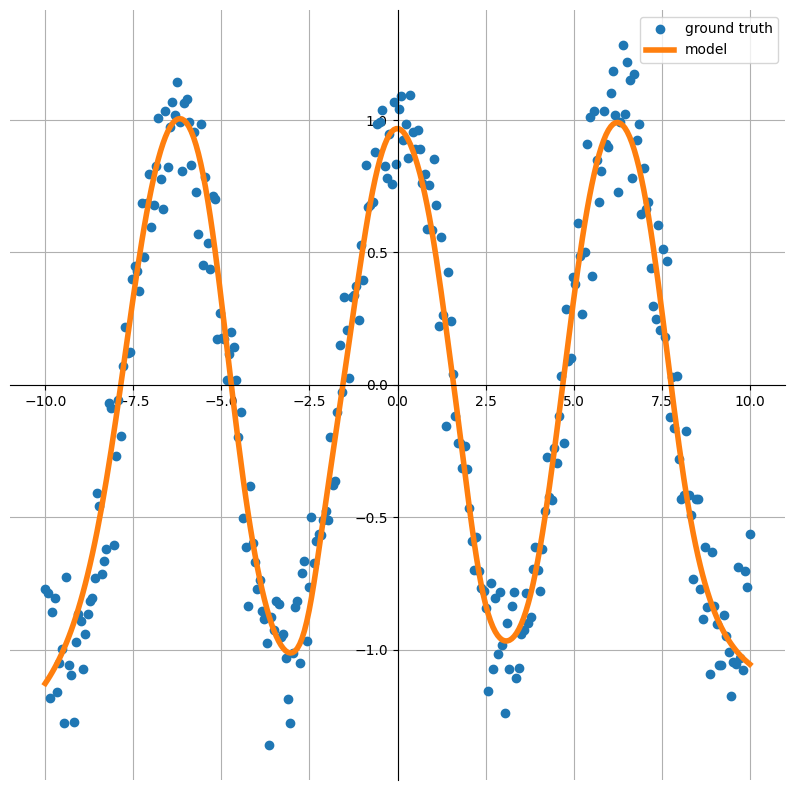

Epoch: 975; Train Loss: 0.02358493022620678


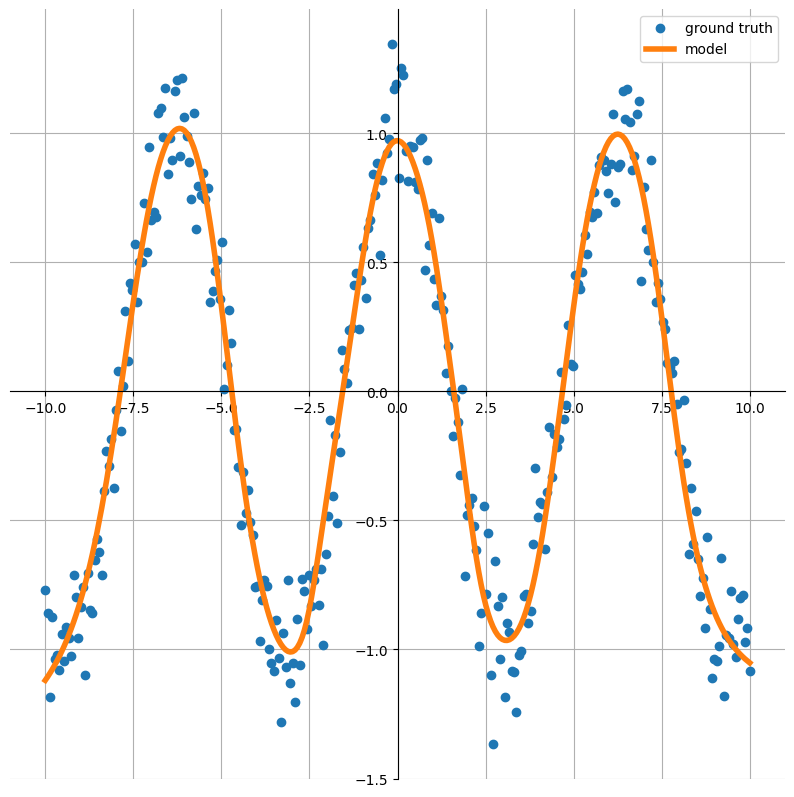

Epoch: 1000; Train Loss: 0.023429373279213905


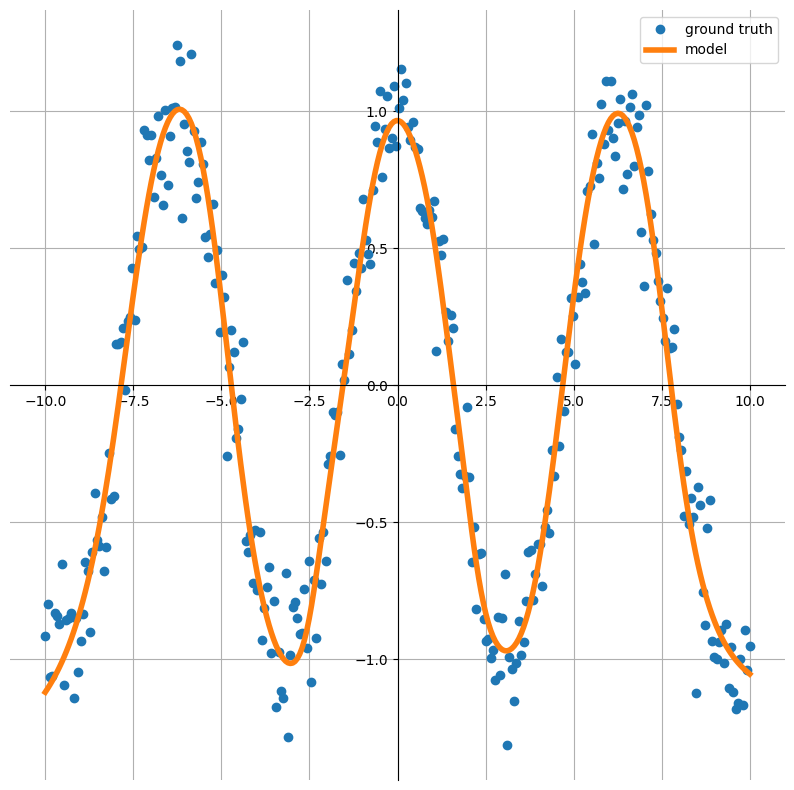

Test Loss: 0.022204924374818802


In [61]:
# model 
model = MultiLayerNetwork()

# loss function
lossfunc = nn.MSELoss()

#optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

#Load dataset
line = lambda x: np.cos(x) + 0.15*np.random.randn()
interval = (-10, 10)
train_nsamples = 1000
test_nsamples = 100
train_dataset = AlgebraicDataset(line, interval, train_nsamples)
test_dataset = AlgebraicDataset(line, interval, test_nsamples)
batch_size = 1000
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

#train 
epochs = 1001

# Let''s make a Gif of the training
filename_output = "./pytorch_regression.gif"
writer = imageio.get_writer(filename_output, mode='I', duration=0.3)

for t in range(epochs):
  train_loss = train(model, train_dataloader, lossfunc, optimizer)
  if t % 25 == 0:
    print(f"Epoch: {t}; Train Loss: {train_loss}")
    image = plot_comparison(line, model)
    # appending to gif
    writer.append_data(image)

test_loss = test(model, test_dataloader, lossfunc)
print(f"Test Loss: {test_loss}")
writer.close()

## 3. Resultados e Discussão

Foi observado na seção anterior que a rede MLP prosposta conseguiu estimar a função $cos(x)$ que corresponde a média da distribuição  $P(Y|X)$. Isso foi possível uma vez que as camadas escondidas permitem construir, de maneira não - linear, novas características a partir das características de entrada.

É importante evidenciar também o papel do otimizador no processo de convergência. Incialmente, o clássico gradiente estocástico foi utilizado, porém, como se observa na imagem a seguir, o mesmo estagnou em um mínimo local na época 1001. Já o Adam, que combina o método dos momentos com um taxa de aprendizagem adaptativa, conseguiu convergir para um mínimo global, logo após as primeiras épocas.

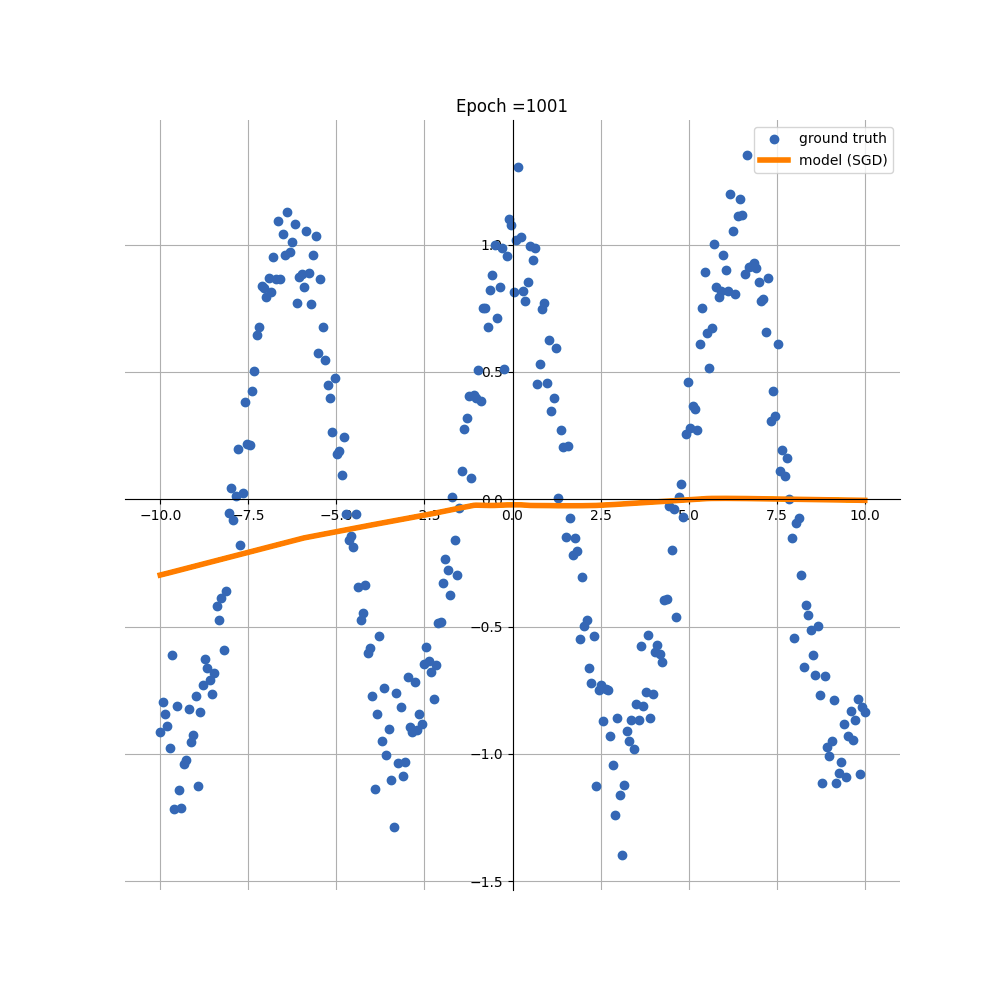

Outro parâmetro fundamental para a rápida convergẽncia da rede é a função de ativação. Foi feita na figura a seguir uma comparação entre o uso da Sigmoid e ReLu como função de ativação para MLP proposta. É possível notar que a convergência fazendo uso da ReLu foi mais acentuada.

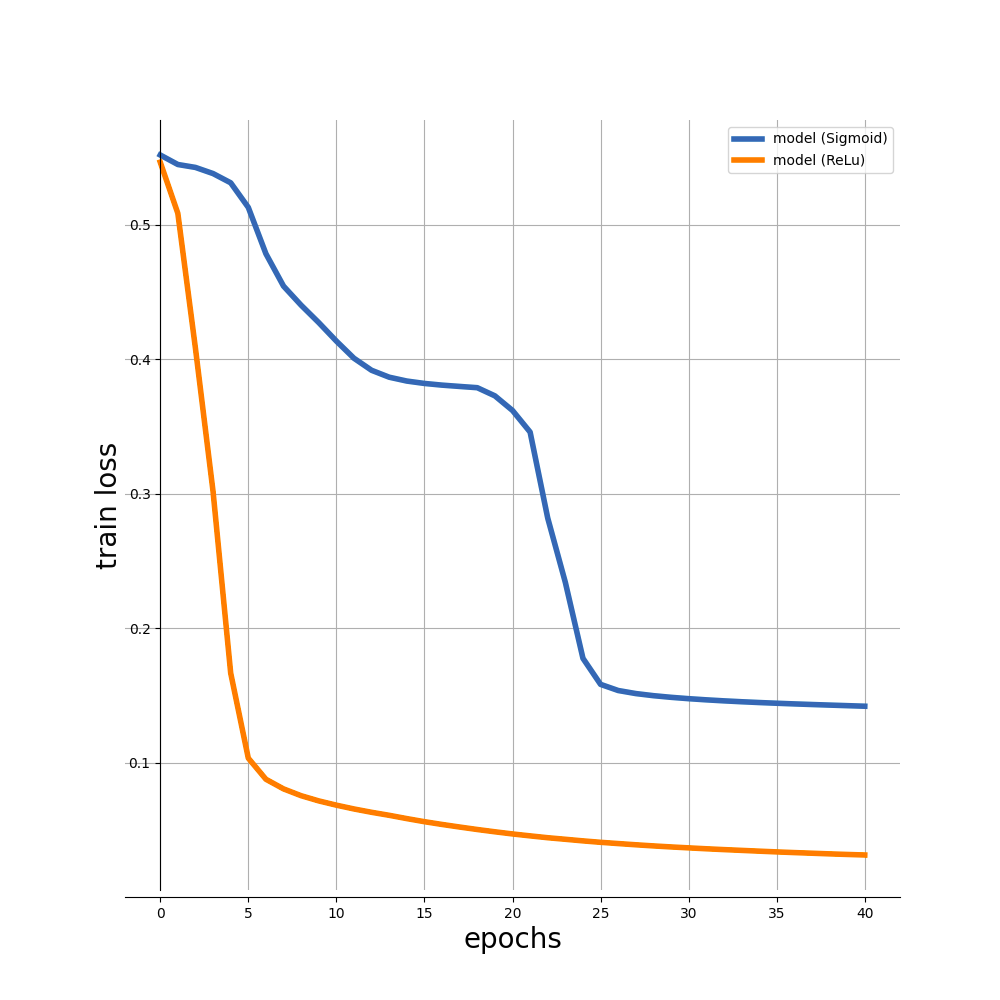

## 4. Referências Bibliográficas

DÜRR, Oliver; SICK, Beate; MURINA, Elvis. Probabilistic deep learning: With python, keras and tensorflow probability. Manning Publications, 2020.

CALIN, Ovidiu. Deep learning architectures. New York City: Springer International Publishing, 2020.
